In [4]:
import awkward as ak
import uproot
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib as mpl
import sys
import math
from numpy import genfromtxt
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score


sys.path.append('/home/jbohm/start_tf/LCStudies')
from  util import graph_util as gu
from data import particle_data_visualize_plot_utils as pu
%matplotlib inline

Load Dataset

In [5]:
# by generic definition of spherical to cartesian coord conversion
def spherical_to_cartesian_cor(rs, phis, thetas):
    # convert to x, y, z
    x, y, z = [], [], []

    for i, r in enumerate(rs):
        x.append(r*np.cos(phis[i]))
        y.append(r*np.sin(phis[i]))
        z.append( r/np.tan(thetas[i]))

    return x,y,z

# load and process pion file
pion_dir = "/fast_scratch_1/jbohm/train_testing_data/pion_files"
pi0_file_num = 13
pipm1_file_num = 11
pipm2_file_num = 12
len_file = 6000
i_low = 60
i_high = 64
energy_threshold = 0
BATCH_SIZE = 200

# load cell geo tree dict
file = uproot.open("/data/atlas/data/rho_delta/rho_small.root")
cell_geo_tree = file["CellGeo"]

node_feature_names = cell_geo_tree.keys()[1:7] # 'cell_geo_sampling', 'cell_geo_eta', 'cell_geo_phi', 'cell_geo_rPerp', 'cell_geo_deta', 'cell_geo_dphi'

file_names = ["/pi0_" + str(pi0_file_num) + "_pipm_" + str(pipm1_file_num) + "_" + str(pipm2_file_num) + "_len_" + str(len_file) + "_i_" + str(i) + ".npy" for i in range(i_low, i_high + 1)]
#file_names = ["/pipm_" + str(pipm1_file_num) + "_" + str(pipm2_file_num) + "_" + str(pi0_file_num) + "_len_" + str(len_file) + "_i_" + str(i) + ".npy" for i in range(i_low, i_high + 1)]

#file_names = ['/fast_scratch_1/jbohm/train_testing_data/pointnet_train_classify/test/pi0_13_pipm_11_12_len_6000_i_60_cartesian_2_classes.npz'
#        '/fast_scratch_1/jbohm/train_testing_data/pointnet_train_classify/test/pi0_13_pipm_11_12_len_6000_i_61_cartesian_2_classes.npz']

cell_geo_data = cell_geo_tree.arrays(library='np')
cell_geo_ID = cell_geo_data['cell_geo_ID'][0]
sorter = np.argsort(cell_geo_ID)

# cluster data dict to look up data by feature name
processed_event_data = {}

cell_geo_ID = cell_geo_data['cell_geo_ID'][0]
num_cells = 0

for feature in [*node_feature_names, 'x', 'y', 'z', 'truth_EM_frac', 'cluster_cell_E', 'cluster_cell_truth_E', 'cell_hits_E_EM', 'cell_hits_E_non_EM', 'truth_particle', 'truth_EM_frac_class']:
    processed_event_data[feature] = []

for file_name in file_names:
    event_data = np.load(pion_dir + file_name, allow_pickle=True).item()
    num_events = len(event_data["eventNumber"])
    clus_count = 0

    for event_idx in range(num_events):
        num_clusters = event_data["nCluster"][event_idx]

        # append empty array for all cells in an event
        for cluster_idx in range(num_clusters):
            cell_IDs = event_data['cluster_cell_ID'][event_idx][cluster_idx]

            # get truth enery (EM/nonEM)
            cell_hits_E_EM = np.array(event_data["cluster_cell_hitsE_EM"][event_idx][cluster_idx])
            cell_hits_E_non_EM = np.array(event_data["cluster_cell_hitsE_nonEM"][event_idx][cluster_idx])
            cell_hits_E = cell_hits_E_EM + cell_hits_E_non_EM

            # filter out cells with truth energy of 0
            threshold_E = cell_hits_E > energy_threshold

            cell_IDs = cell_IDs[threshold_E]
            num_cells += len(cell_IDs)
            cell_ID_map = sorter[np.searchsorted(cell_geo_ID, cell_IDs, sorter=sorter)]

            # get truth energy fraction EM/EM + nonEM for each cell
            truth_EM_frac = cell_hits_E_EM[threshold_E] / cell_hits_E[threshold_E]
            truth_EM_frac_class = [0 if truth_EM_frac_i <= 0.94810295 else 1 for truth_EM_frac_i in truth_EM_frac]
            cell_hits_E =  cell_hits_E[threshold_E]
            cell_hits_E_EM = cell_hits_E_EM[threshold_E]
            cell_hits_E_non_EM = cell_hits_E_non_EM[threshold_E]

            # get cluster cell energy
            cluster_cell_E = event_data["cluster_cell_E"][event_idx][cluster_idx][threshold_E]

            # node features
            node_features = {}
            for feature in node_feature_names:
                node_features[feature] = cell_geo_data[feature][0][cell_ID_map]

            # get cartesian coords
            thetas = [2*np.arctan(np.exp(-eta)) for eta in node_features["cell_geo_eta"]]
            x, y, z = spherical_to_cartesian_cor(node_features["cell_geo_rPerp"], node_features["cell_geo_phi"], thetas)

            # get target particle - 0 for pi0 [111], 1 for pi+/- [-111]
            truth_particle = 0 if event_data["truthPartPdgId"][event_idx][0] == 111 else 1
            
            # if grouped by clusters append the set of clusters points
            if num_cells != 0:
                processed_event_data["truth_EM_frac"].append(truth_EM_frac)
                processed_event_data["truth_EM_frac_class"].append(truth_EM_frac_class)
                processed_event_data["cluster_cell_E"].append(cluster_cell_E)
                processed_event_data["cluster_cell_truth_E"].append(cell_hits_E)
                processed_event_data["cell_hits_E_EM"].append(cell_hits_E_EM)
                processed_event_data["cell_hits_E_non_EM"].append(cell_hits_E_non_EM)

                for feature in node_feature_names:
                    processed_event_data[feature].append(node_features[feature])

                processed_event_data["x"].append(x)
                processed_event_data["y"].append(y)
                processed_event_data["z"].append(z)

                processed_event_data["truth_particle"].append(truth_particle)
                
                num_cells = 0
                clus_count += 1
    # filter to BS multiple num samples/files - to make set even with preds from a trained model
    
    BS_multiple_num_clus = math.floor(clus_count / BATCH_SIZE)*BATCH_SIZE
    print("BS multiple:", BS_multiple_num_clus)
    print(len(processed_event_data["truth_particle"]))
    for key in processed_event_data:
        del processed_event_data[key][BS_multiple_num_clus - clus_count:]
    print(len(processed_event_data["truth_particle"]))
    

# takes ~7 min for 50 files?
# takes ~ 7s for 1 file
# for 15 files takes ~

BS multiple: 8800
8894
8800
BS multiple: 9200
18063
18000
BS multiple: 9200
27247
27200
BS multiple: 9000
36310
36200
BS multiple: 9000
45229
45200


Split into EM frac classes

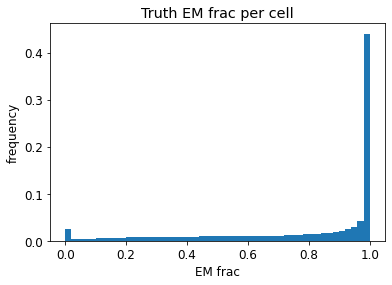

0.9480249


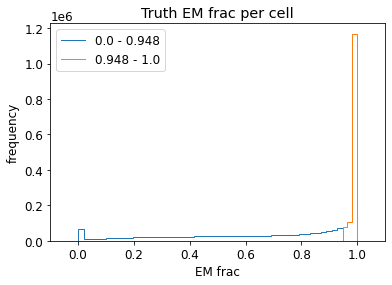

In [31]:
# plot hist of cellwise truth EM frac
truth_EM_frac_cellwise = np.array([cell_data for clus_data in processed_event_data["truth_EM_frac"] for cell_data in clus_data])
pu.plot_hist(truth_EM_frac_cellwise, 50, "Truth EM frac per cell", "EM frac", "frequency")

# split array into N equal parts
num_class = 2
truth_EM_frac_cellwise_sort = np.sort(truth_EM_frac_cellwise)
truth_EM_frac_cellwise_split = np.array_split(truth_EM_frac_cellwise_sort, num_class)
print(np.max(truth_EM_frac_cellwise_split[0]))

labels = np.arange(num_class)
fig = plt.figure()
fig.patch.set_facecolor('white')
for i, data in enumerate(truth_EM_frac_cellwise_split):
    bins = math.ceil((np.max(data) - np.min(data))*50)
    counts, bins = np.histogram(data, bins, density=False)
    # normalize counts
    plt.stairs(counts, bins, label=str(np.round(np.min(data), 4)) + " - " + str(np.round(np.max(data), 4)))

plt.title("Truth EM frac per cell")
plt.xlabel("EM frac")
plt.ylabel("frequency")
plt.xlim((-0.1,1.1))
plt.legend()
plt.show()



Train Analysis

In [68]:
MASK_OUT = -1
THRESHOLD_EM_FRAC = 0.94810295

def get_accuracy(preds, labels):
    unmasked = labels != MASK_OUT
    preds = preds[unmasked]
    labels = labels[unmasked]
    correct = []
    for i, pred in enumerate(preds):
        acc = (pred <= 0.5)*(1 - labels[i]) + (pred > 0.5)*labels[i]
        correct.append(acc)
    return sum(correct) / len(correct) 

def get_masked_pointwise_bce(preds, labels):
    unmasked = labels != MASK_OUT
    epsilon = 1e-7#np.exp(-20)
    preds = preds[unmasked]
    labels = labels[unmasked]
    bce = -(labels*np.log(preds + epsilon) + (1-labels)*np.log(1-preds + epsilon))
    
    return bce

# plot train and val loss over epoch
def plot_epoch_loss(train_loss, val_loss):
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.plot(train_loss, label="train")
    plt.plot(val_loss, label="val")
    plt.xlabel("epoch")
    plt.ylabel("loss")
    plt.legend()
    plt.show()

def plot_accuracy(preds, labels, num_epoch):
    accuracy = []
    for epoch in range(num_epoch):
        accuracy.append(get_accuracy(preds[epoch], labels))
    print("accuracy:", accuracy)
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.plot(accuracy)
    plt.xlabel("epoch")
    plt.ylabel("accuracy")
    plt.show()

def plot_test_loss(preds, labels, num_epoch):
    test_loss = []
    for epoch in range(num_epoch):
        test_loss.append(np.mean(get_masked_pointwise_bce(preds[epoch], labels)))
    print("test loss:", test_loss)
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.plot(test_loss)
    plt.xlabel("epoch")
    plt.ylabel("test loss")
    plt.show()

def get_cut_count(EM_frac, p_yi, cut_EM_frac_low, cut_EM_frac_high, cut_p_yi_low, cut_p_yi_high):
    EM_frac = np.array(EM_frac)
    p_yi = np.array(p_yi)
    point_cut = (EM_frac >= cut_EM_frac_low) & (EM_frac < cut_EM_frac_high) & (p_yi >= cut_p_yi_low) & (p_yi < cut_p_yi_high)
    return len(EM_frac[point_cut])

def em_frac_vs_preds(em_frac, preds, title="All clusters", bin_size=50):
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.hist2d(em_frac, preds, (bin_size, bin_size), cmap=plt.cm.magma_r, norm=mpl.colors.LogNorm())

    plt.axvline(x=0.94810295, color='grey')
    plt.axhline(y=0.5, color='grey')
    
    plt.ylim((0,1))
    plt.colorbar(label="frequency")
    plt.xlabel("EM frac")
    plt.ylabel("P(EM frac >= 0.9481)")
    plt.title(title)
    plt.show()


def em_frac_vs_preds_normalize_col(em_frac, preds, title="All clusters", bin_size=(50,50)):
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    hist, xedges, yedges = np.histogram2d(em_frac, preds, bin_size)
    for i in range(hist.shape[0]):
        hist[i, :] = hist[i, :] / np.sum(hist[i, :])

    plt.plot(x,y,'wo',alpha=0.3)
    plt.imshow(hist.T, 
               extent=[xedges.min(),xedges.max(),yedges.min(),yedges.max()],
               origin='lower', 
               interpolation='nearest', 
               cmap=plt.cm.terrain_r,
               vmin=0,
               vmax=1,
               aspect='auto')
    
    #plt.imshow(hist, cmap=plt.cm.magma)
    plt.axvline(x=0.94810295, color='grey')
    plt.axhline(y=0.5, color='grey')

    plt.ylim((0,1))
    plt.colorbar(label="frequency")
    plt.xlabel("EM frac")
    plt.ylabel("P(EM frac >= 0.9481)")
    plt.title(title)
    plt.show()

def plot_preds_hist_cut_em_frac(preds, em_frac, em_frac_low, em_frac_high, bins=50):
    em_frac = np.array(em_frac)
    em_frac_cut = (em_frac >= em_frac_low) & (em_frac < em_frac_high)
    pu.plot_hist(preds[em_frac_cut], bins, str(round(em_frac_low, 3)) + " <= truth em frac < " + str(round(em_frac_high, 3)), "P(EM frac >= 0.9481)", "frequency", colour="darkseagreen")
    
def plot_accuracy_over_em_cut(preds, labels, em_frac, num_points):
    em_frac = np.array(em_frac)
    accuracy = []

    for i in range(num_points):
        em_frac_cut = (em_frac >= i*(1/num_points)) & (em_frac < (i+1)*(1/num_points))
        accuracy.append(get_accuracy(preds[em_frac_cut], labels[em_frac_cut]))
    
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.plot(np.arange(1/num_points, 1 + (1/num_points), 1/num_points), accuracy, color="mediumorchid")
    plt.axvline(x=0.94810295, color='grey', linewidth='0.5')
    plt.xlabel("EM frac")
    plt.ylabel("Accuracy")
    plt.title("Classification accuracy vs truth EM frac")
    plt.xlim((-0.1, 1.1))
    plt.show()


def plot_quadrent_info(preds, em_frac, bin_size=50):
    # if plotting p(yi) output accuracy for each quandrant
    bin_size = 1 / bin_size

    plt.rcParams["figure.figsize"] = [4, 1]
    font = {'size'   : 16}
    mpl.rc('font', **font)

    # count freq at in quadrant
    print("quadrants")
    bottom_left = get_cut_count(em_frac, preds, 0, THRESHOLD_EM_FRAC, 0, bin_size*25)
    top_left = get_cut_count(em_frac, preds, 0, THRESHOLD_EM_FRAC, bin_size*25, 1.1)
    bottom_right = get_cut_count(em_frac, preds, THRESHOLD_EM_FRAC, 1.1, 0, bin_size*25)
    top_right = get_cut_count(em_frac, preds, THRESHOLD_EM_FRAC, 1.1, bin_size*25, 1.1)

    fig, axs = plt.subplots(1, 1)
    fig.patch.set_facecolor('white')
    axs.axis('tight')
    axs.axis('off')
    table = axs.table(cellText=[[round(top_left/len(em_frac), 4), round(top_right/len(em_frac), 4)], 
        [round(bottom_left/len(em_frac), 4), round(bottom_right/len(em_frac), 4)]], loc='center')
    table.scale(1,2)
    plt.show()

    # count freq at corner points
    print("corners")
    point_0_0 = get_cut_count(em_frac, preds, 0, bin_size, 0, bin_size)
    point_0_1 = get_cut_count(em_frac, preds, 0, bin_size, 1 - bin_size, 1.1)
    point_1_0 = get_cut_count(em_frac, preds, 1 - bin_size, 1.1, 0, bin_size)
    point_1_1 =  get_cut_count(em_frac, preds, 1 - bin_size, 1.1, 1 - bin_size, 1.1)

    fig, axs = plt.subplots(1, 1)
    fig.patch.set_facecolor('white')
    axs.axis('tight')
    axs.axis('off')
    
    table = axs.table(cellText=[[round(point_0_1/len(em_frac), 4), round(point_1_1/len(em_frac), 4)],
        [round(point_0_0/len(em_frac), 4), round(point_1_0/len(em_frac), 4)]], loc='center')
    table.scale(1,2)
    plt.show()

    plt.rcParams["figure.figsize"] = [6,4]
    font = {'size'   : 12}
    mpl.rc('font', **font)

    # sum check
    #print("Total cells (len(em_frac)):", len(em_frac))
    #print("Total cells in quadrants:", bottom_left + top_left + bottom_right + top_right)

    # class accuracy
    #print("Left class accuracy [P(EM frac < 0.9481)]:", bottom_left / (bottom_left + top_left))
    #print("Right class accuracy [P(EM frac >= 0.9481)]:", top_right / (bottom_right + top_right))

def plot_cut_accuracies(preds, labels, em_frac):
    # get cuts
    neutral_cut_cellwise = []
    for cluster_idx, truth_particle in enumerate(processed_event_data["truth_particle"]):
        neutral_cut_cellwise.extend(np.tile(not truth_particle, len(processed_event_data["truth_EM_frac"][cluster_idx])))
    neutral_cut_cellwise = np.array(neutral_cut_cellwise)

    em_class_cut = (np.array(labels) == 1)

    em_frac_one = (em_frac == 1)

    accuracies = [["", "Had class", "EM class", "EM frac = 1", "0.948 <= EM frac < 1", "Both classes"],
                  ["Neutral", round(get_accuracy(preds[neutral_cut_cellwise & ~em_class_cut], labels[neutral_cut_cellwise & ~em_class_cut]), 3),
                    round(get_accuracy(preds[neutral_cut_cellwise & em_class_cut], labels[neutral_cut_cellwise & em_class_cut]), 3),
                    round(get_accuracy(preds[neutral_cut_cellwise & em_frac_one], labels[neutral_cut_cellwise & em_frac_one]), 3),
                    round(get_accuracy(preds[neutral_cut_cellwise & ~em_frac_one], labels[neutral_cut_cellwise & ~em_frac_one]), 3),
                    round(get_accuracy(preds[neutral_cut_cellwise], labels[neutral_cut_cellwise]), 3)],
                  ["Charged", round(get_accuracy(preds[~neutral_cut_cellwise & ~em_class_cut], labels[~neutral_cut_cellwise & ~em_class_cut]), 3),
                    round(get_accuracy(preds[~neutral_cut_cellwise & em_class_cut], labels[~neutral_cut_cellwise & em_class_cut]), 3),
                    round(get_accuracy(preds[~neutral_cut_cellwise & em_frac_one], labels[~neutral_cut_cellwise & em_frac_one]), 3),
                    round(get_accuracy(preds[~neutral_cut_cellwise & ~em_frac_one], labels[~neutral_cut_cellwise & ~em_frac_one]), 3),
                    round(get_accuracy(preds[~neutral_cut_cellwise], labels[~neutral_cut_cellwise]), 3)],
                  ["Mixed", round(get_accuracy(preds[~em_class_cut], labels[~em_class_cut]), 3),
                    round(get_accuracy(preds[em_class_cut], labels[em_class_cut]), 3),
                    round(get_accuracy(preds[em_frac_one], labels[em_frac_one]), 3),
                    round(get_accuracy(preds[~em_frac_one], labels[~em_frac_one]), 3),
                    round(get_accuracy(preds, labels), 3)]]
    
    plt.rcParams["figure.figsize"] = [20, 2]
    font = {'size'   : 16}
    mpl.rc('font', **font)

    print("accuracies:")
    fig, axs = plt.subplots(1, 1)
    fig.patch.set_facecolor('white')
    axs.axis('tight')
    axs.axis('off')
    
    table = axs.table(cellText=accuracies, loc='center')
    table.scale(1,2)
    plt.show()

    plt.rcParams["figure.figsize"] = [6,4]
    font = {'size'   : 12}
    mpl.rc('font', **font)


def plot_filtered_em_frac_vs_preds(preds, em_frac, filter="None", title=None, xlabel="", bins=75):
    if filter == "None":
        em_frac_vs_preds(preds, em_frac, "All cells")

    if filter == "truth_particle":
        neutral_cut_cellwise = []
        for cluster_idx, truth_particle in enumerate(processed_event_data["truth_particle"]):
            neutral_cut_cellwise.extend(np.tile(not truth_particle, len(processed_event_data["truth_EM_frac"][cluster_idx])))
        neutral_cut_cellwise = np.array(neutral_cut_cellwise)

        em_frac_vs_preds(em_frac[neutral_cut_cellwise], preds[neutral_cut_cellwise], "Neutral pions")
        em_frac_vs_preds(em_frac[neutral_cut_cellwise], preds[neutral_cut_cellwise], "Charged pions")
    if filter == "EM_frac_0.5" or filter == "EM_frac_class":
        if filter == "EM_frac_0.5":
            threshold = 0.5
        else:
            threshold = 0.94810295
        truth_EM_frac_cellwise = np.array([cell_data for clus_data in processed_event_data["truth_EM_frac"] for cell_data in clus_data])
        em_cut_cellwise = truth_EM_frac_cellwise > threshold
        em_frac_vs_preds(em_frac[em_cut_cellwise], preds[em_cut_cellwise], "EM > " + str(threshold))
        em_frac_vs_preds(em_frac[~em_cut_cellwise], preds[~em_cut_cellwise], "EM <= " + str(threshold))

    if filter == "clus_mean_EM_frac_0.5" or filter == "clus_mean_EM_frac_class":
        if filter == "clus_mean_EM_frac_0.5":
            threshold = 0.5
        else:
            threshold = 0.94810295
        em_cut_clusterwise = []
        for clus_EM_frac in processed_event_data["truth_EM_frac"]:
            em_cut_clusterwise.extend(np.tile(np.mean(clus_EM_frac) > threshold, len(clus_EM_frac)))
        em_cut_clusterwise = np.array(em_cut_clusterwise)

        em_frac_vs_preds(em_frac[em_cut_clusterwise], preds[em_cut_clusterwise], "clus mean EM > " + str(threshold))
        em_frac_vs_preds(em_frac[~em_cut_clusterwise], preds[~em_cut_clusterwise], "clus mean EM <= " + str(threshold))


def plot_cellwise_hist(cellwise_data, filter="None", title=None, xlabel="", bins=75):

    if filter == "None":
        pu.plot_hist(cellwise_data, 50, title, xlabel, "frequency")

    if filter == "truth_particle":
        neutral_cut_cellwise = []
        for cluster_idx, truth_particle in enumerate(processed_event_data["truth_particle"]):
            neutral_cut_cellwise.extend(np.tile(not truth_particle, len(processed_event_data["truth_EM_frac"][cluster_idx])))
        neutral_cut_cellwise = np.array(neutral_cut_cellwise)
        pu.plot_overlay_hist([cellwise_data[neutral_cut_cellwise], cellwise_data[~neutral_cut_cellwise]], bins, title, xlabel, "frequency", ["neutral", "charged"])

    if filter == "EM_frac_0.5" or filter == "EM_frac_class":
        if filter == "EM_frac_0.5":
            threshold = 0.5
        else:
            threshold = 0.94810295
        truth_EM_frac_cellwise = np.array([cell_data for clus_data in processed_event_data["truth_EM_frac"] for cell_data in clus_data])
        em_cut_cellwise = truth_EM_frac_cellwise > threshold
        pu.plot_overlay_hist([cellwise_data[em_cut_cellwise], cellwise_data[~em_cut_cellwise]], bins, title, xlabel, "frequency", ["EM > " + str(threshold), "EM <= " + str(threshold)])

    if filter == "clus_mean_EM_frac_0.5" or filter == "clus_mean_EM_frac_class":
        if filter == "clus_mean_EM_frac_0.5":
            threshold = 0.5
        else:
            threshold = 0.94810295
        em_cut_clusterwise = []
        for clus_EM_frac in processed_event_data["truth_EM_frac"]:
            em_cut_clusterwise.extend(np.tile(np.mean(clus_EM_frac) > threshold, len(clus_EM_frac)))
        em_cut_clusterwise = np.array(em_cut_clusterwise)
        pu.plot_overlay_hist([cellwise_data[em_cut_clusterwise], cellwise_data[~em_cut_clusterwise]], bins, title, xlabel, "frequency", ["clus mean EM > " + str(threshold), "clus mean EM <= " + str(threshold)])



def em_frac_vs_prob_em_class_clus(preds, labels, clus_idx):
    unmasked = labels[clus_idx] != MASK_OUT
    preds = preds[clus_idx][unmasked]
    #labels = labels[clus_idx][unmasked]
    em_frac = processed_event_data["truth_EM_frac"][clus_idx]
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.hist2d(em_frac, preds, (50, 50), range=((0,1),(0,1)), cmap=plt.cm.magma_r)
    plt.axvline(x=0.94810295, color='grey')
    plt.axhline(y=0.5, color='grey')
    plt.colorbar(label="frequency")
    plt.xlabel("EM frac")
    plt.ylabel("P(EM frac >= 0.9481)")
    plt.title("Cluster " + str(clus_idx))
    plt.show()

def plot_roc(preds, labels):
    fp, tp, threshs = roc_curve(labels, preds)
    auc = roc_auc_score(labels, preds)
    print('auc:', auc)

    # compute frac correct classifications for each threshold
    #corr = list(map(lambda thresh: accuracy_score(labels, list(map(lambda pred: pred > thresh, preds))), threshs))
    #print("max acc:", np.max(corr)) 

    # 1) basic roc
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.scatter(fp, tp, linewidth=0.25, color="lightsteelblue")
    plt.title('roc')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.show()

    # 2) signal efficiency vs 1/background efficiency (1/[1-fpr])
    invs_back_eff = np.log10(1 / fp[1:]) # first fp = 0

    # filter out all singal efficiencies < 0.6
    sig_effs = tp[1:]
    rejects = []
    #thresholds = []
    #for i, sig_eff in enumerate(tp):
    #    if sig_eff > 0.6:
    #        sig_effs.append(sig_eff)
    #        rejects.append(invs_back_eff[i])
    #        #thresholds.append(threshs[i])

    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.scatter(sig_effs, invs_back_eff, linewidth=0.25, color="lightsteelblue")#, c=thresholds)
    plt.title('roc')
    plt.xlabel('signal efficiency (TPR)')
    plt.ylabel('log10[1/(1 - background efficiency)] (1/FPR)')
    plt.show()

def plot_clus_em_frac_mean_cut_class_similar(em_frac, cut_class_similar_low, cut_class_similar_high, bins=50):
    cut_clus = [(cut_class_similar_low <= (np.sum(clus_em_frac > THRESHOLD_EM_FRAC) / len(clus_em_frac)) and (np.sum(clus_em_frac > THRESHOLD_EM_FRAC) / len(clus_em_frac)) <= cut_class_similar_high) or
                (cut_class_similar_low <= (np.sum(clus_em_frac <= THRESHOLD_EM_FRAC) / len(clus_em_frac)) and (np.sum(clus_em_frac < THRESHOLD_EM_FRAC) / len(clus_em_frac)) <= cut_class_similar_high)
            for clus_em_frac in em_frac]


    clus_em_frac_mean = np.array([np.mean(clus_em_frac) for clus_em_frac in em_frac])[cut_clus]

    em_class_clus_em_frac_mean = np.array([np.mean(clus_em_frac[np.array(clus_em_frac) > THRESHOLD_EM_FRAC]) for clus_em_frac in em_frac])[cut_clus]
    had_class_clus_em_frac_mean = np.array([np.mean(clus_em_frac[np.array(clus_em_frac) <= THRESHOLD_EM_FRAC]) for clus_em_frac in em_frac])[cut_clus]


    pu.plot_hist(clus_em_frac_mean, bins, "clusters with " + str(cut_class_similar_low) + " <= similarity < " + str(cut_class_similar_high), "clus mean cell em frac", "frequency", True, "darkseagreen", (0,1))
    pu.plot_overlay_hist([em_class_clus_em_frac_mean, had_class_clus_em_frac_mean], bins, "clusters with " + str(cut_class_similar_low) + " <= similarity < " + str(cut_class_similar_high), "clus mean cell em frac", "frequency", ["em class", "had class"], ["darkseagreen", "orchid"], (0,1))

def plot_clus_cell_em_frac_cut_class_similar(em_frac, cut_class_similar_low, cut_class_similar_high, num_clus, bins=50):
    cut_clus = [(cut_class_similar_low <= (np.sum(clus_em_frac > THRESHOLD_EM_FRAC) / len(clus_em_frac)) and (np.sum(clus_em_frac > THRESHOLD_EM_FRAC) / len(clus_em_frac)) <= cut_class_similar_high) or
                (cut_class_similar_low <= (np.sum(clus_em_frac <= THRESHOLD_EM_FRAC) / len(clus_em_frac)) and (np.sum(clus_em_frac < THRESHOLD_EM_FRAC) / len(clus_em_frac)) <= cut_class_similar_high)
            for clus_em_frac in em_frac]
    
    
    colour_cycle = ["darkseagreen", "orchid", "lightsteelblue", "lightsalmon", "darkviolet", "darkcyan"]    

    i = 0
    clus_idx = 0
    clus_cell_em_frac = []
    labels = []
    colours = []

    while num_clus != 0:
        if cut_clus[clus_idx]:
            clus_cell_em_frac.append(em_frac[clus_idx])
            labels.append("cluster " + str(clus_idx))
            colours.append(colour_cycle[i])
            num_clus -= 1
            i += 1
        clus_idx += 1

    pu.plot_overlay_hist(clus_cell_em_frac, bins, "clusters with " + str(cut_class_similar_low) + " <= similarity <= " + str(cut_class_similar_high), "cell em frac", "frequency", labels, colours, (0,1))

def plot_clus_similarity_distribution(preds, labels, bins):
    clus_frac_em_class = np.array([np.sum(clus_labels[clus_labels != -1]) / len(clus_labels[clus_labels != -1]) for clus_labels in labels])

    pu.plot_hist(clus_frac_em_class, bins, "All clusters truth classes", "frac of cells with em class", "frequency", True, "darkseagreen", (-0.1,1.1))
    
    neutral_clus_cut = np.array(processed_event_data["truth_particle"]) == 0 
    pu.plot_overlay_hist([clus_frac_em_class[neutral_clus_cut], clus_frac_em_class[~neutral_clus_cut]], bins, "", "frac of cells with em class", "frequency", ["neutral", "charged"], ["darkseagreen", "orchid"], (0,1))
    
    # plot 2d distribution vs cellwise accuracy
    clus_mean_acc = np.array([get_accuracy(clus_preds, labels[i]) for i, clus_preds in enumerate(preds)])
    print("len preds(# clus):", len(preds))
    print("len clus mean acc:", len(clus_mean_acc))
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.hist2d(clus_frac_em_class, clus_mean_acc, (bins, bins), range=((0,1),(0,1)), cmap=plt.cm.terrain_r, norm=mpl.colors.LogNorm())
    plt.colorbar(label="frequency")
    plt.xlabel("clus frac of cells with em class")
    plt.ylabel("clus mean accuracy")
    plt.title("All clusters")
    plt.show()

    # plot for neutral
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.hist2d(clus_frac_em_class[neutral_clus_cut], clus_mean_acc[neutral_clus_cut], (bins, bins), range=((0,1),(0,1)), cmap=plt.cm.terrain_r, norm=mpl.colors.LogNorm())
    plt.colorbar(label="frequency")
    plt.xlabel("clus frac of cells with em class")
    plt.ylabel("clus mean accuracy")
    plt.title("Neutral")
    plt.show()

    # plot for charged
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.hist2d(clus_frac_em_class[~neutral_clus_cut], clus_mean_acc[~neutral_clus_cut], (bins, bins), range=((0,1),(0,1)), cmap=plt.cm.terrain_r, norm=mpl.colors.LogNorm())
    plt.colorbar(label="frequency")
    plt.xlabel("clus frac of cells with em class")
    plt.ylabel("clus mean accuracy")
    plt.title("Charged")
    plt.show()

def plot_clus_preds_similarity_distribution(preds, labels, bins):
    clus_frac_pred_em_class = np.array([np.sum(preds[i][clus_labels != -1]) / len(clus_labels[clus_labels != -1]) for i, clus_labels in enumerate(labels)])

    pu.plot_hist(clus_frac_pred_em_class, bins, "All clusters - predicted classes", "clus frac of cells with em class", "frequency", True, "darkseagreen", (-0.1,1.1))
    
    neutral_clus_cut = np.array(processed_event_data["truth_particle"]) == 0
    pu.plot_overlay_hist([clus_frac_pred_em_class[neutral_clus_cut], clus_frac_pred_em_class[~neutral_clus_cut]], bins, "", "clus frac of cells with em class", "frequency", ["neutral", "charged"], ["darkseagreen", "orchid"], (0,1))
    
    # plot 2d distribution vs cellwise accuracy
    clus_mean_acc = np.array([get_accuracy(clus_preds, labels[i]) for i, clus_preds in enumerate(preds)])

    #print("mean clus acc:", np.mean(clus_mean_acc))
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    plt.hist2d(clus_frac_pred_em_class, clus_mean_acc, (bins, bins), range=((0,1),(0,1)), cmap=plt.cm.terrain_r, norm=mpl.colors.LogNorm())
    plt.colorbar(label="frequency")
    plt.xlabel("clus frac of cells with em class")
    plt.ylabel("clus mean accuracy")
    plt.title("All clusters")
    plt.show()

def plot_clus_info_dist(preds, labels, clus_frac_em_class_cut_low, clus_frac_em_class_cut_high, clus_mean_acc_cut_low, clus_mean_acc_cut_high, bins=50, title=""):
    clus_frac_em_class = np.array([np.sum(clus_labels[clus_labels != -1]) / len(clus_labels[clus_labels != -1]) for clus_labels in labels])
    clus_mean_acc = np.array([get_accuracy(clus_preds, labels[i]) for i, clus_preds in enumerate(preds)])

    clus_num_cells = np.array([len(clus_labels[clus_labels != -1]) for clus_labels in labels])
    clus_mean_cell_em_frac = np.array([np.mean(clus_truth_em_frac) for clus_truth_em_frac in processed_event_data["truth_EM_frac"]])

    clus_cut = (clus_frac_em_class_cut_low <= clus_frac_em_class) & (clus_frac_em_class < clus_frac_em_class_cut_high) & (clus_mean_acc_cut_low <= clus_mean_acc) & (clus_mean_acc < clus_mean_acc_cut_high)
    
    pu.plot_hist(clus_num_cells[clus_cut], bins, title, "num cells", "frequency", colour="darkseagreen")
    pu.plot_hist(clus_mean_cell_em_frac[clus_cut][clus_mean_cell_em_frac[clus_cut] >0.98], bins, title, "mean cell em frac", "frequency", colour="darkseagreen")

# 3D visualization
def plot_proccessed_cells_in_line(x,y,z,cell_data, title, xlabel, ylabel, zlabel, colour_theme, bar_label, vmin=None, vmax=None, same_axis=True):
    fig = plt.figure()
    fig.patch.set_facecolor('white')
    fig.set_size_inches(5*len(cell_data), 5)
    for i, cell_data_i in enumerate(cell_data):
        ax = fig.add_subplot(1, len(cell_data), i + 1, projection='3d')
        x_i = x[i] if len(x) > 1 else x[0]
        y_i = y[i] if len(y) > 1 else y[0]
        z_i = z[i] if len(z) > 1 else z[0]
        xlabel_i = xlabel[i] if len(xlabel) > 1 else xlabel[0]
        ylabel_i = ylabel[i] if len(ylabel) > 1 else ylabel[0]
        zlabel_i = zlabel[i] if len(zlabel) > 1 else zlabel[0]
        title_i = title[i] if len(title) > 1 else title[0]

            
        p = ax.scatter(x_i, y_i, z_i, c=cell_data_i, vmin=vmin[i], vmax=vmax[i], cmap=colour_theme[i])
        fig.colorbar(p, label=bar_label[i], fraction=0.025, pad=0.15)
        ax.set_xlabel(xlabel_i)
        ax.set_ylabel(ylabel_i)
        ax.set_zlabel(zlabel_i)
        plt.title(title_i)
    plt.show()


def plot_cluster_3d_info(preds, labels, clus_idxs):
    for cluster_idx in clus_idxs:
        #print("cluster idx:", cluster_idx)
        #print("mean absolute error:", mae[cluster_idx], "[rank " + str(start_rank + i)+"/" + str(tot_clus) + "]")
        #print("mean truth EM frac:", truth_EM_frac[cluster_idx])
        #print("particle:", processed_event_data["truth_particle"][cluster_idx])
        #print("num hits:", len(processed_event_data["z"][cluster_idx]))
        x = [processed_event_data["z"][cluster_idx]]
        y = [processed_event_data["x"][cluster_idx]]
        z = [processed_event_data["y"][cluster_idx]]
        clus_truth = np.array(processed_event_data["truth_EM_frac_class"][cluster_idx])
        clus_preds = preds[cluster_idx]
        clus_acc = (preds[cluster_idx] <= 0.5)*(1 - labels[cluster_idx]) + (preds[cluster_idx] > 0.5)*labels[cluster_idx]
        cell_data = [processed_event_data["cell_geo_sampling"][cluster_idx], np.log10(processed_event_data["cluster_cell_truth_E"][cluster_idx]), clus_truth, clus_preds, clus_acc]
        title = ["sampling layers", "truth energy", "truth EM frac class", "predicted EM frac", "error"]
        xlabel = ["z"]
        ylabel = ["x"]
        zlabel = ["y"]
        colour_theme = [plt.cm.tab20b, plt.cm.magma, plt.cm.cool, plt.cm.cool, plt.cm.RdYlGn_r]
        bar_label = ["Sampling layers", "Cell truth energy (log(GeV))", "Cell em frac class", "P(EM frac >= 0.9481)", "Cluster accuracy"]
        vmin = [0, None, 0, 0, 0]
        vmax = [23, None, 1, 1, 1]

        plot_proccessed_cells_in_line(x, y, z, cell_data, title, xlabel, ylabel, zlabel, colour_theme, bar_label, vmin, vmax)




In [10]:
def train_summary_stats(file_name, num_epochs, clusters=[]):
    # load all train data
    dir = '/fast_scratch_1/jbohm/train_testing_data/pointnet_train' + file_name 
    loss_data = genfromtxt(dir + "/log_loss.csv", delimiter=',').transpose()
    loss = loss_data[1]
    val_loss = loss_data[2]

    # plot train and val loss
    plot_epoch_loss(loss, val_loss)

    preds = []
    labels = np.load(dir + "/tests/labels.npy")

    # check if loaded data matches test data
    print("num em class (test data):", np.sum(labels[labels != -1], axis=None))
    print("num em class(loaded data):", sum([cell if cell != -1 else 0 for clus in processed_event_data["truth_EM_frac_class"] for cell in clus]))

    for epoch in range(num_epochs):
        preds.append(np.load(dir + "/tests/preds_" + str(epoch) + ".npy"))
    
    plot_test_loss(preds, labels, num_epochs)
    plot_accuracy(preds, labels, num_epochs)

    preds_unpad = preds[-1][labels != -1]
    em_frac = [cell for clus in processed_event_data["truth_EM_frac"] for cell in clus]
    em_frac_vs_preds(preds_unpad, em_frac)
    em_frac_vs_preds_normalize_col(preds_unpad, em_frac)


ValueError: 'c' argument has 1 elements, which is inconsistent with 'x' and 'y' with size 39.

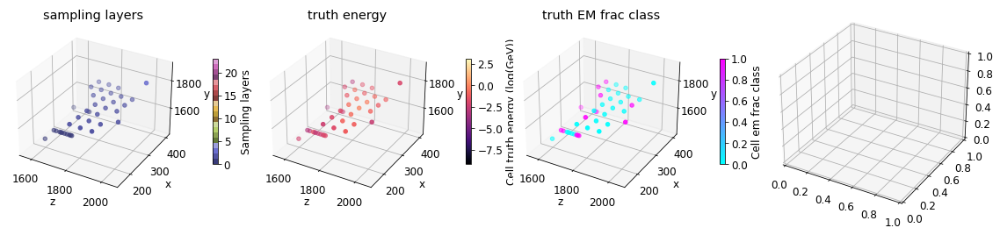

In [69]:
dir = '/fast_scratch_1/jbohm/train_testing_data/pointnet_train_classify/pnet_part_seg_no_tnets_tr_329_val_66_tst_5'
epoch = 12 # start at 0
labels_unmasked = np.load(dir + "/tests/labels.npy")
preds_unmasked = (np.load(dir + "/tests/preds_" + str(epoch) + ".npy"))
pointwise_loss = get_masked_pointwise_bce(preds_unmasked, labels_unmasked)

preds = preds_unmasked[labels_unmasked != -1]
labels = labels_unmasked[labels_unmasked != -1]

em_frac = np.array([cell for clus in processed_event_data["truth_EM_frac"] for cell in clus])

plot_cluster_3d_info(preds, labels, [0])
assert(False)
#plot_clus_info_dist(preds_unmasked, labels_unmasked, 0, 1/50, 0, 1/50, 50, "Bottom left corner")
plot_clus_info_dist(preds_unmasked, labels_unmasked, 49/50, 1.1, 49/50, 1.1, 50, "Top right corner")
plot_clus_info_dist(preds_unmasked, labels_unmasked, 0, 1/50, 49/50, 1.1, 50, "Top left corner")
plot_clus_info_dist(preds_unmasked, labels_unmasked, 49/50, 1.1, 0, 1/50, 50, "Bottom right corner")

plot_clus_similarity_distribution(preds_unmasked, labels_unmasked, 50)
plot_clus_preds_similarity_distribution(preds_unmasked, labels_unmasked, 50)

#plot_clus_cell_em_frac_cut_class_similar(processed_event_data["truth_EM_frac"], 0.98, 0.9999999, 6)
#plot_clus_em_frac_mean_cut_class_similar(processed_event_data["truth_EM_frac"], 0.0000000001, 0.1, 50)
#plot_clus_em_frac_mean_cut_class_similar(processed_event_data["truth_EM_frac"], 0.00001, 0.2, 50)
#plot_clus_em_frac_mean_cut_class_similar(processed_event_data["truth_EM_frac"], 1, 1, 50)

em_frac_vs_preds(em_frac, preds)
em_frac_vs_preds_normalize_col(em_frac, preds, "All clusters", (100, 25))
em_frac_vs_preds_normalize_col(em_frac, preds, "All clusters", (100, 2))

# plot preds hist cut by em frac
num_hist = 0
for i in range(num_hist):
    plot_preds_hist_cut_em_frac(preds, em_frac, i*(1/(num_hist)), (i+1)*(1/(num_hist)))

plot_accuracy_over_em_cut(preds, labels, em_frac, 500)

plot_quadrent_info(preds, em_frac)

em_frac_cut = (em_frac == 0) 
print("accuracy when EM frac = 0:", round(get_accuracy(preds[em_frac_cut], labels[em_frac_cut]), 3))
em_frac_cut = (em_frac == 1)
print("accuracy when EM frac = 1:", round(get_accuracy(preds[em_frac_cut], labels[em_frac_cut]), 3))

plot_cut_accuracies(preds, labels, em_frac)

#plot_roc(preds, labels)#


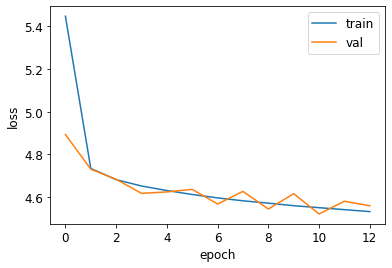

num em class (test data): 1350861.0
num em class(loaded data): 1350861
test loss: [2.433174567428963, 2.582738860161603, 2.6739978299676337, 2.9346759153976683, 2.799423847327729, 2.7941434316108893, 3.034839108565613, 2.828111935863503, 3.0476541751893405, 2.8885731645298165, 3.1061091452097944, 3.368198512978398, 3.2525445717498966]


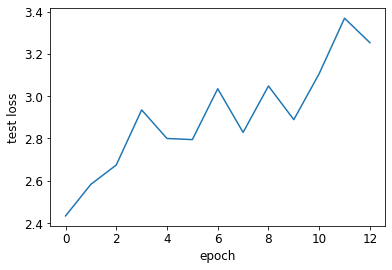

accuracy: [0.6862702361057865, 0.6959529268621214, 0.6985262445843392, 0.7031252081523179, 0.7020269040108824, 0.7008338674367623, 0.7053958261482237, 0.7007676287435963, 0.7072886245590871, 0.702366978642277, 0.7086637250272726, 0.7047278884880852, 0.7057780863160481]


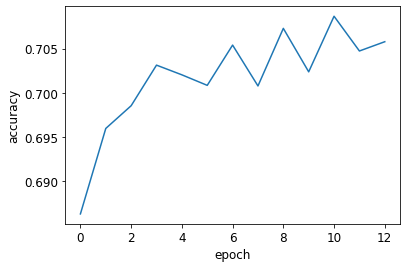

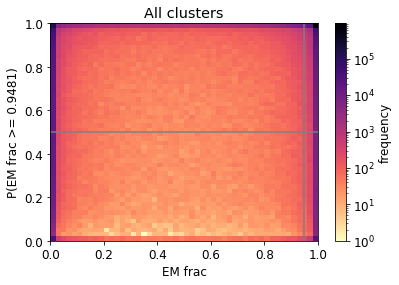

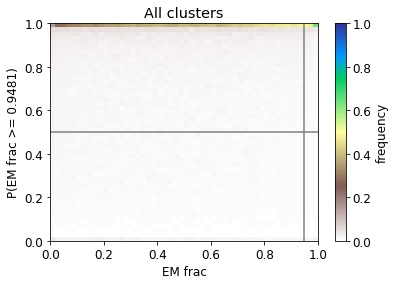

In [18]:
train_summary_stats("_classify/pnet_part_seg_no_tnets_tr_329_val_66_tst_5", 13)

/tmp/ipykernel_2018/1614522011.py:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


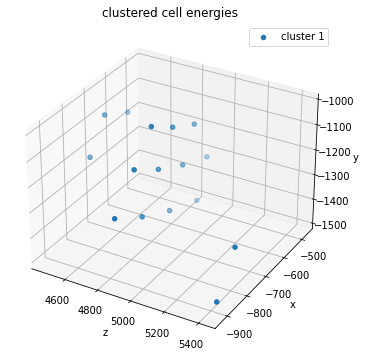

/tmp/ipykernel_2018/1614522011.py:42: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


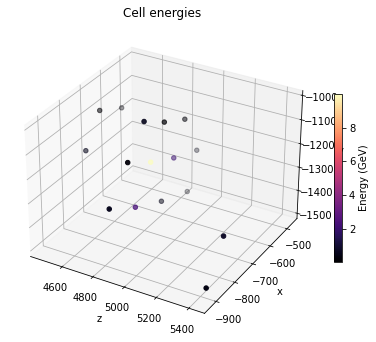

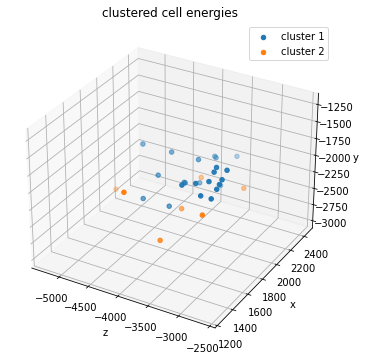

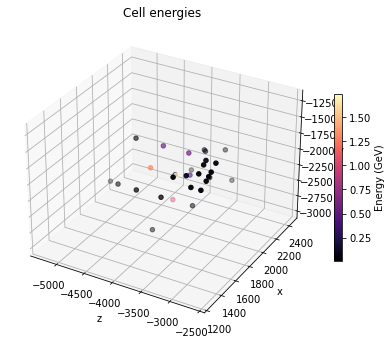

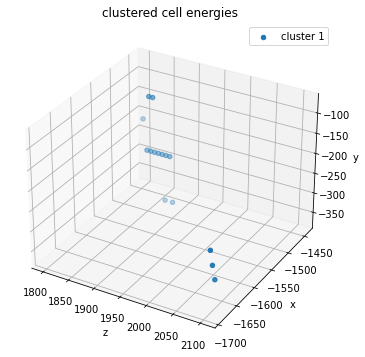

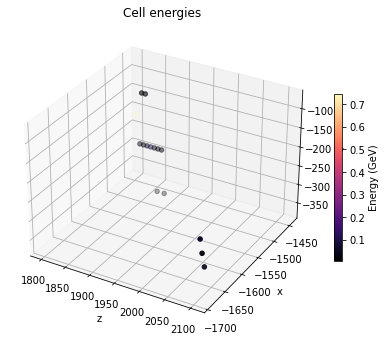

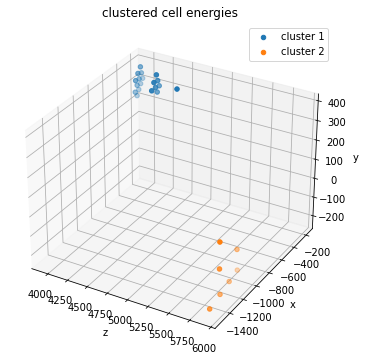

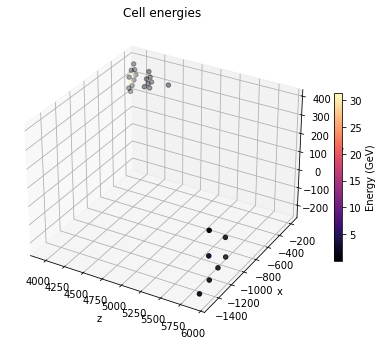

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


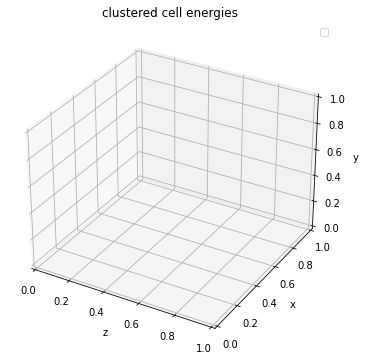

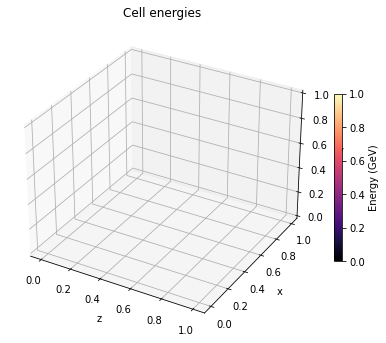

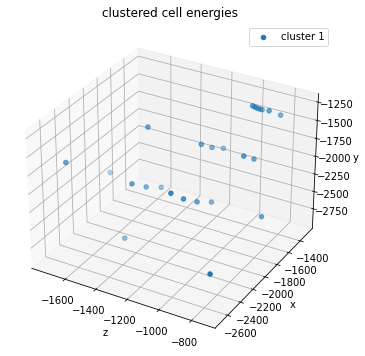

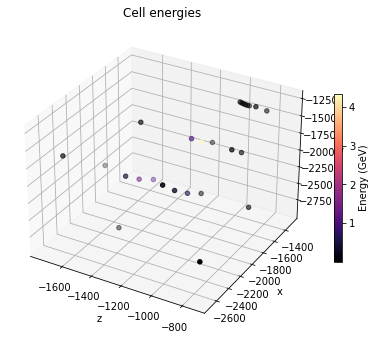

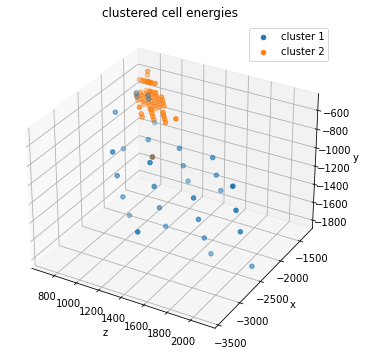

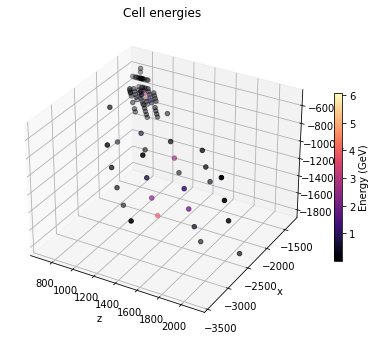

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


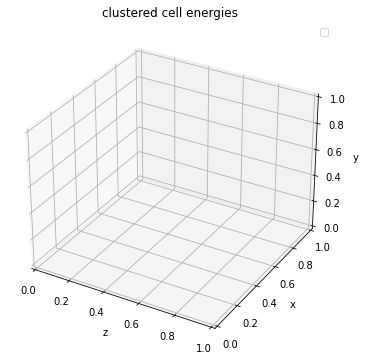

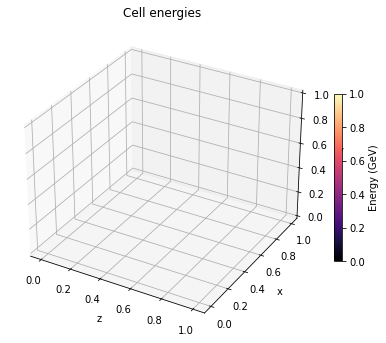

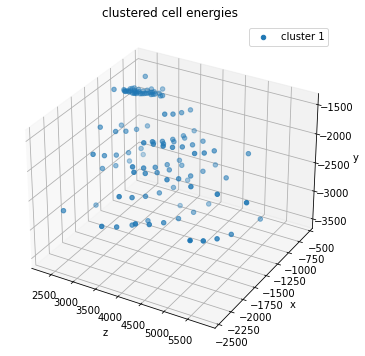

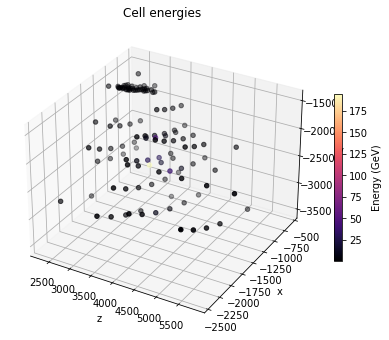

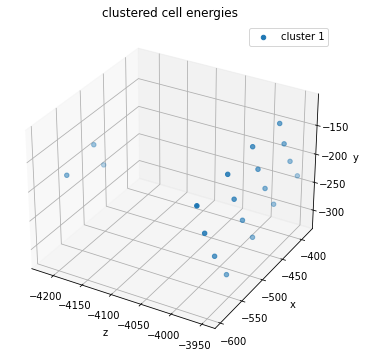

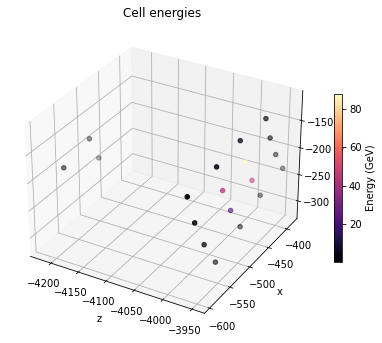

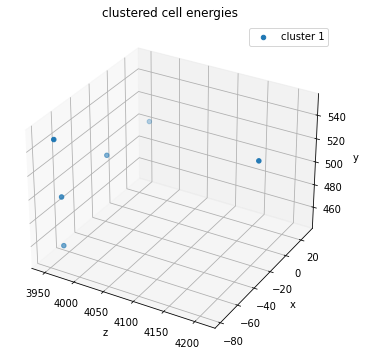

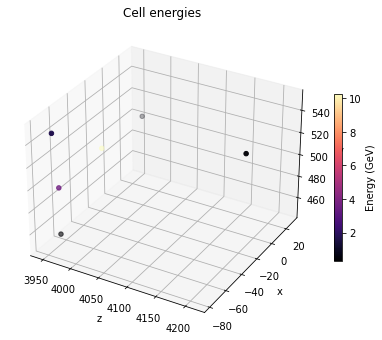

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


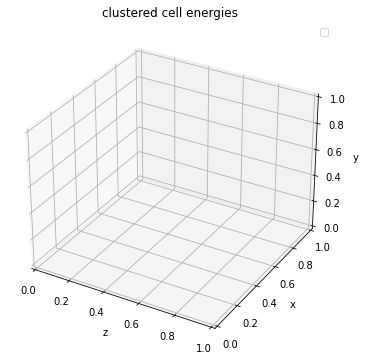

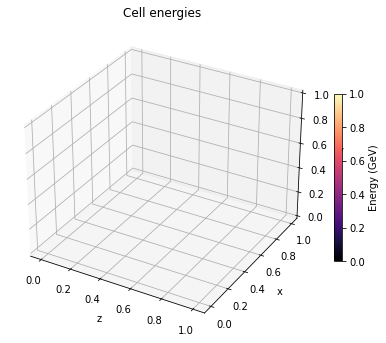

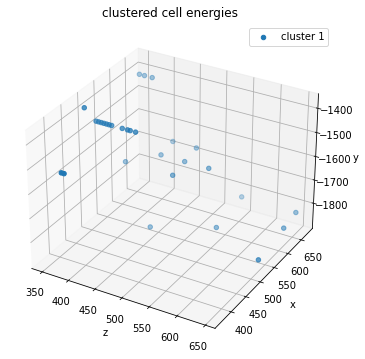

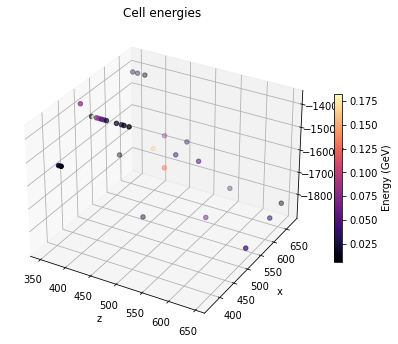

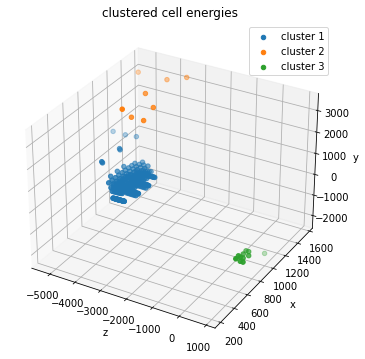

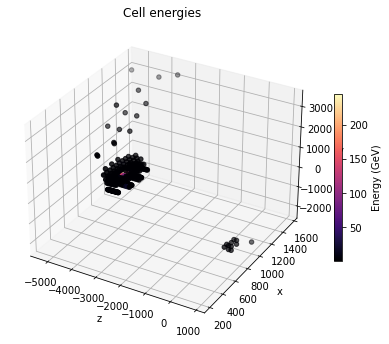

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


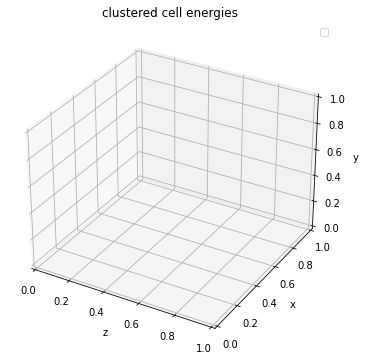

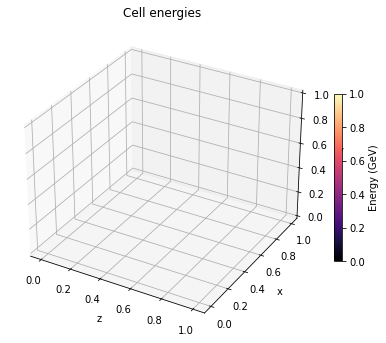

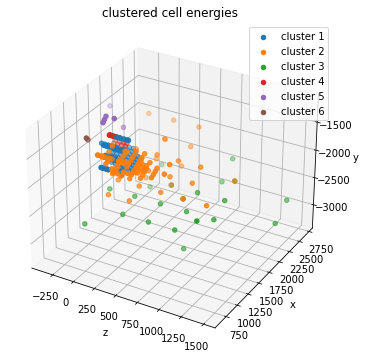

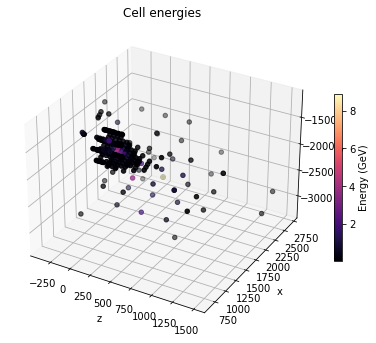

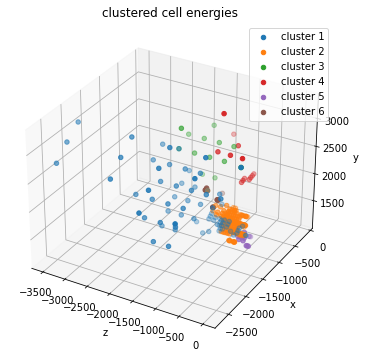

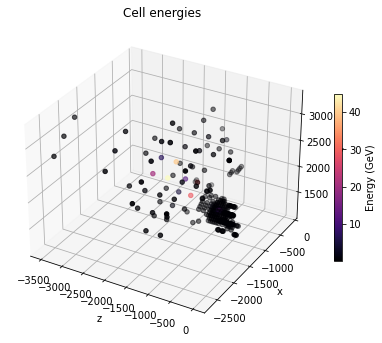

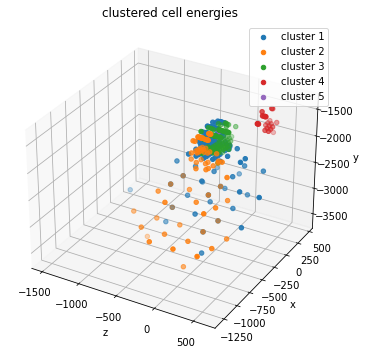

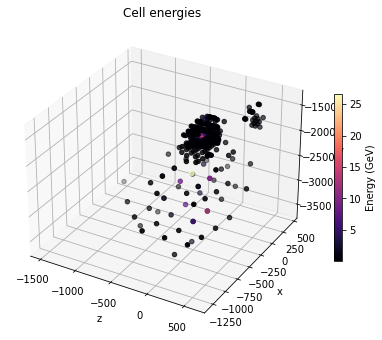

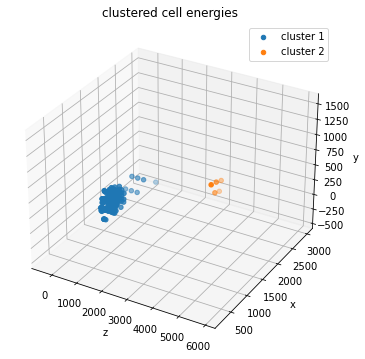

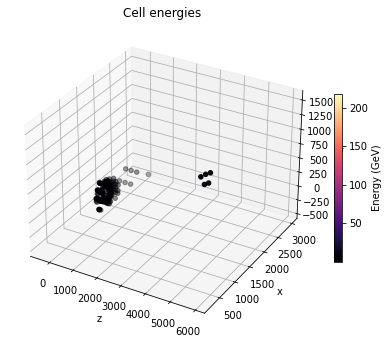

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


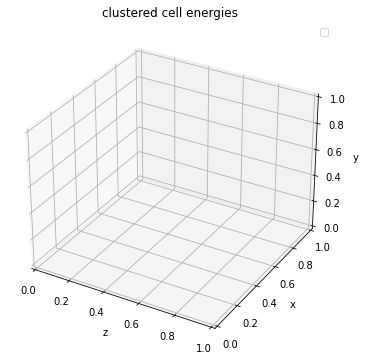

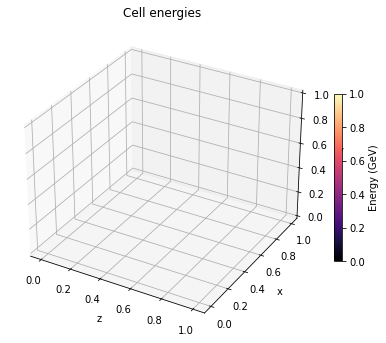

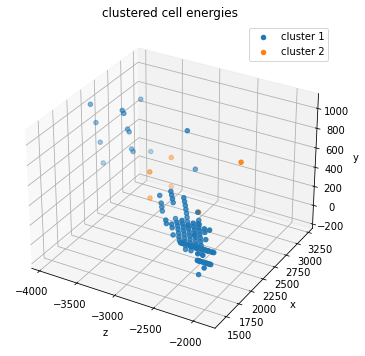

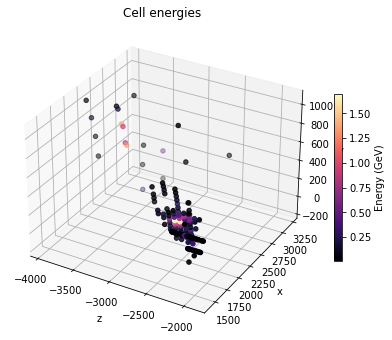

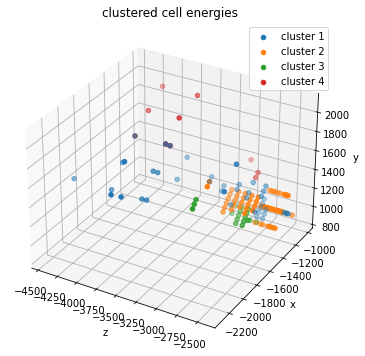

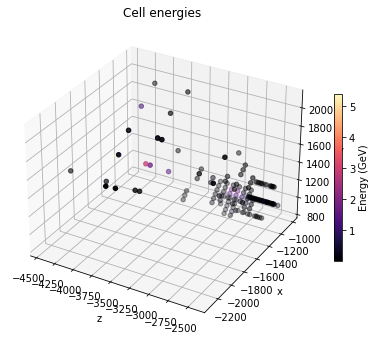

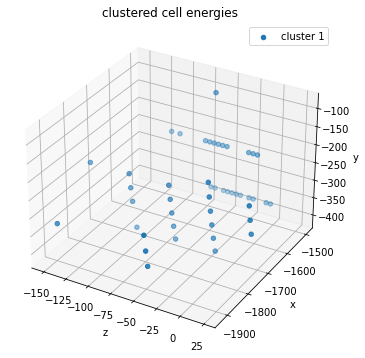

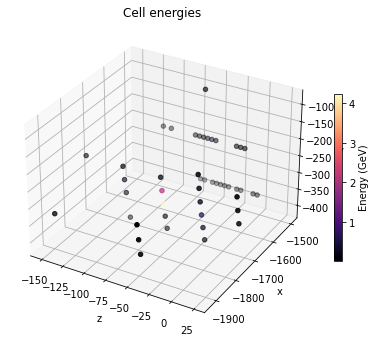

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


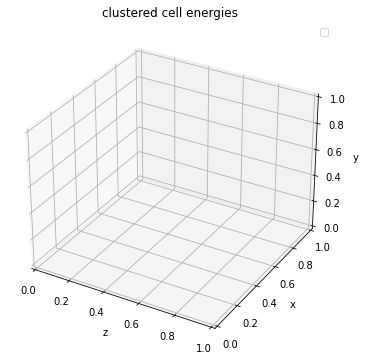

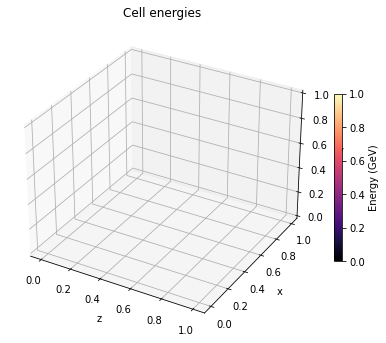

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


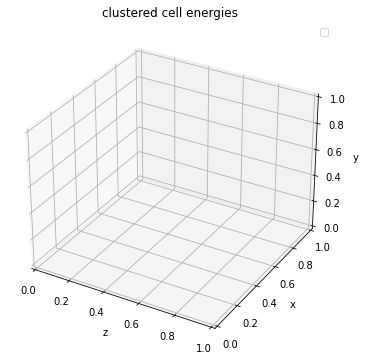

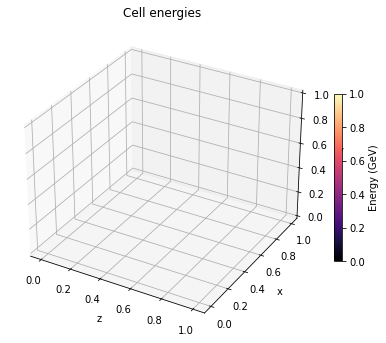

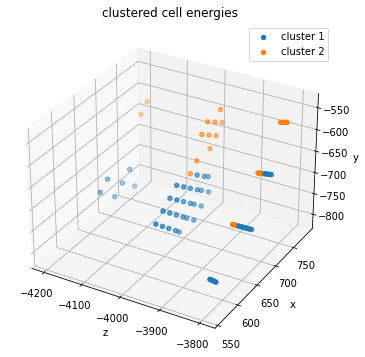

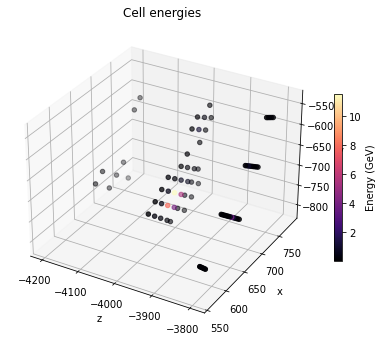

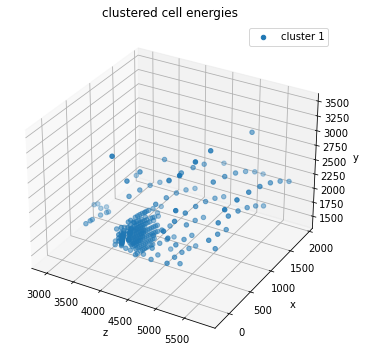

...

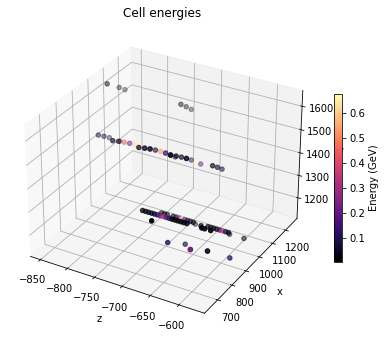

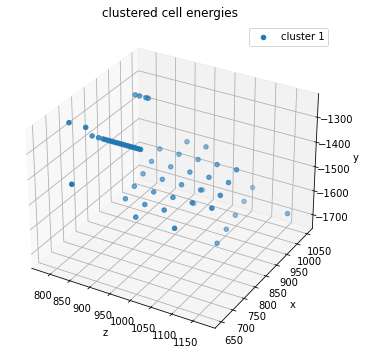

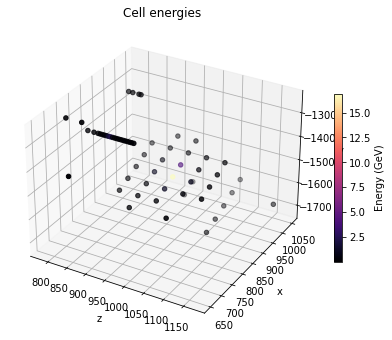

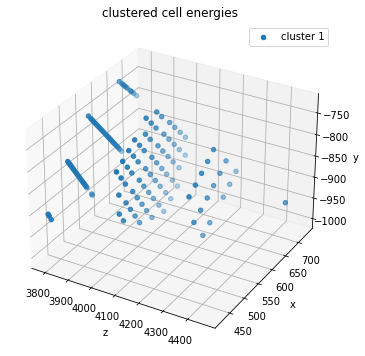

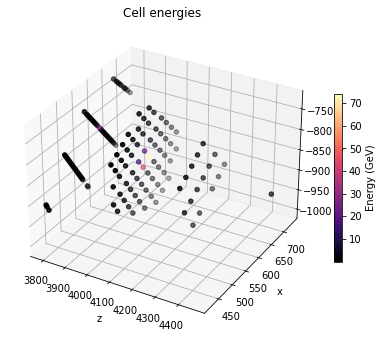

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


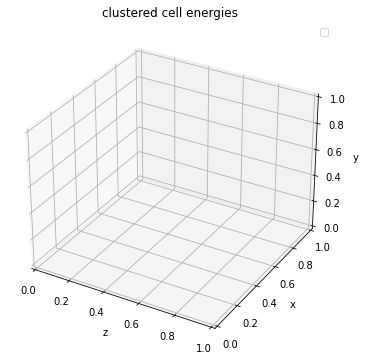

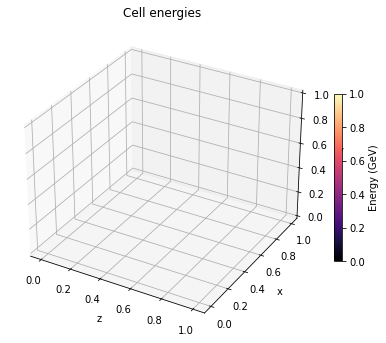

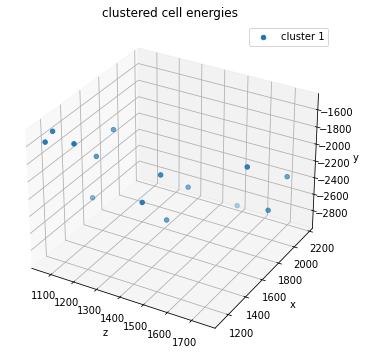

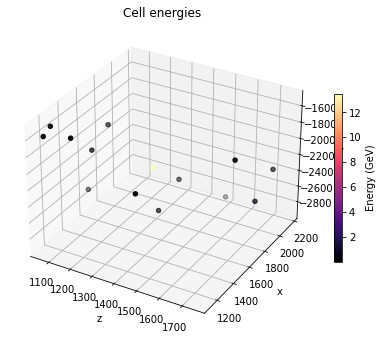

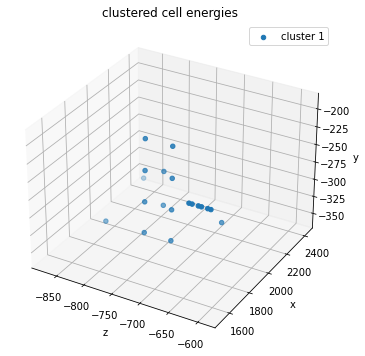

...

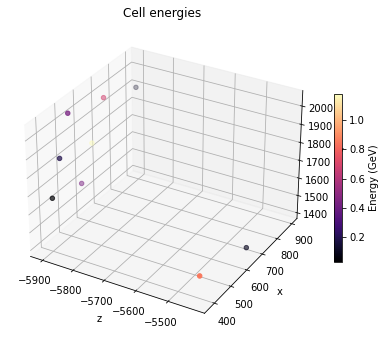

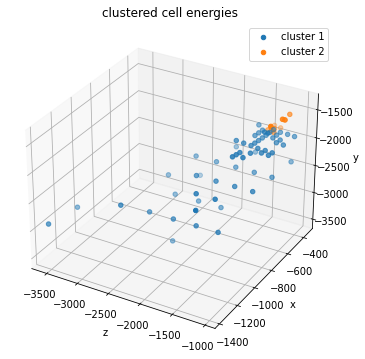

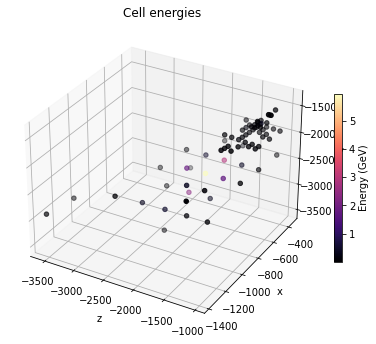

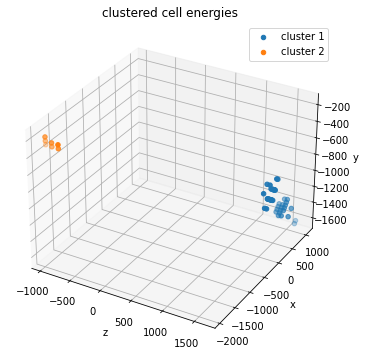

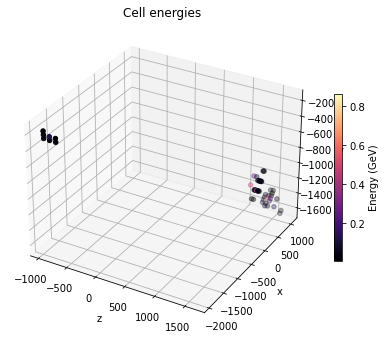

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


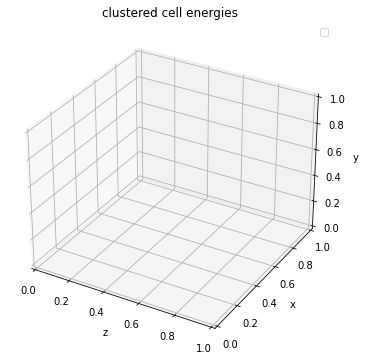

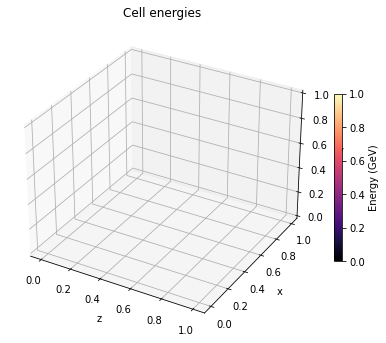

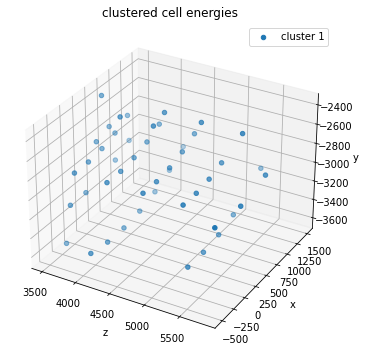

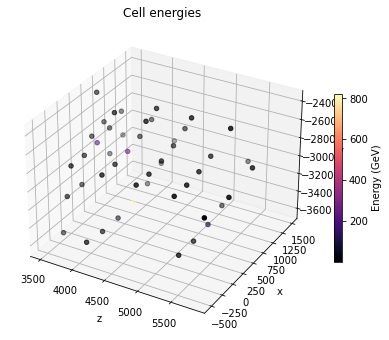

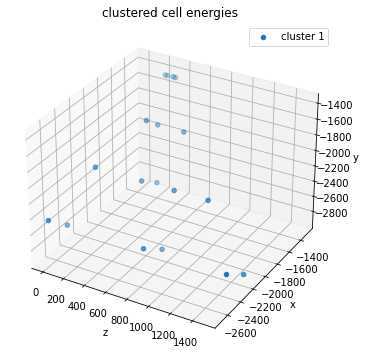

...

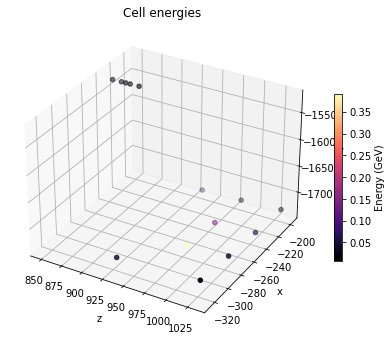

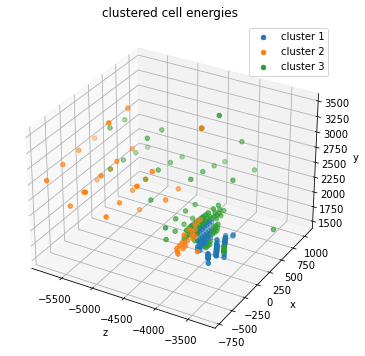

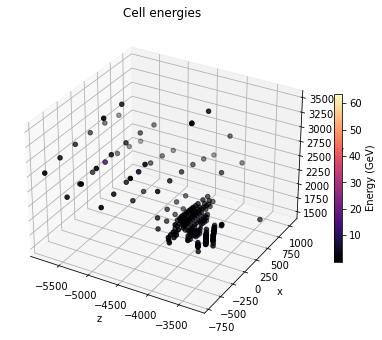

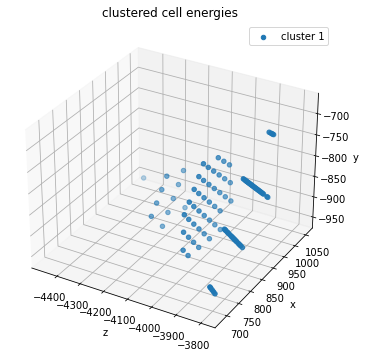

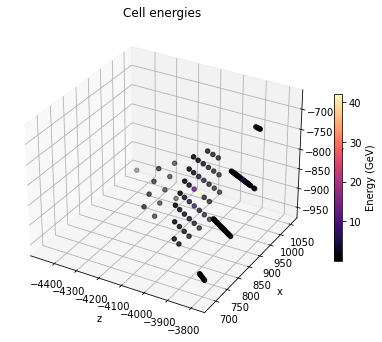

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


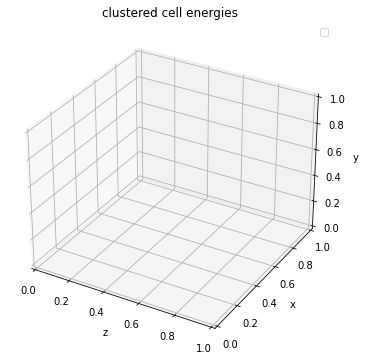

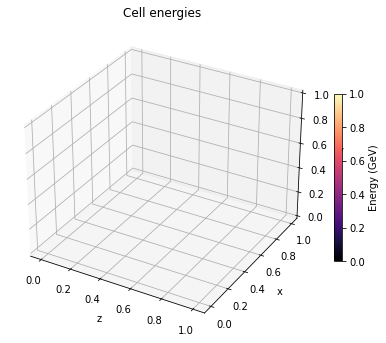

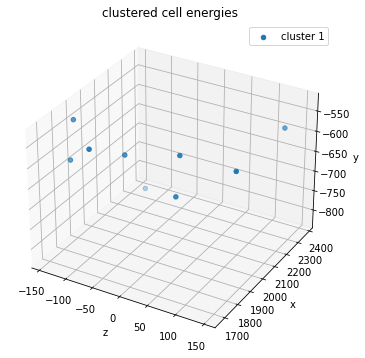

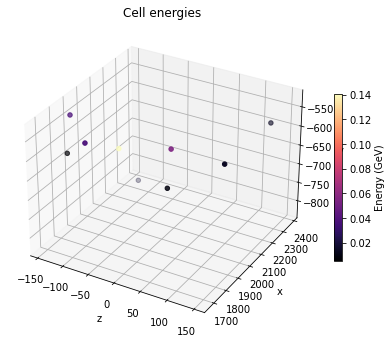

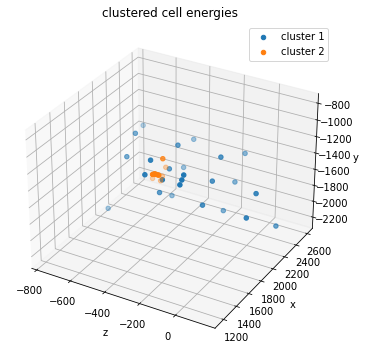

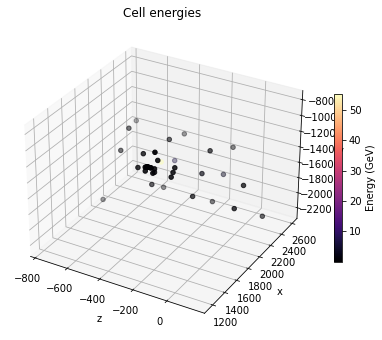

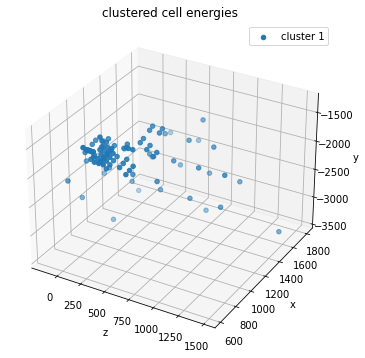

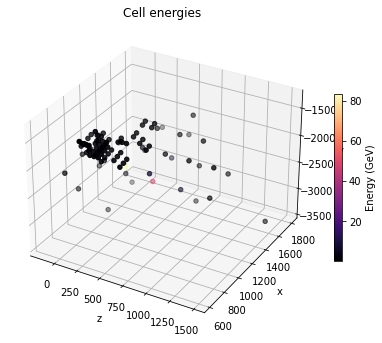

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


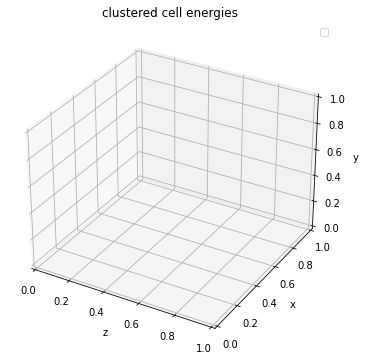

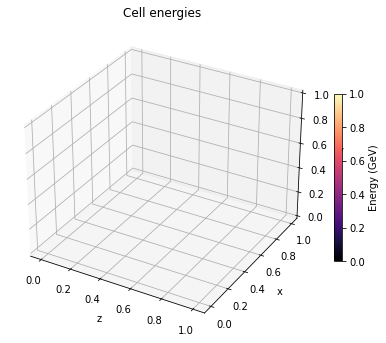

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


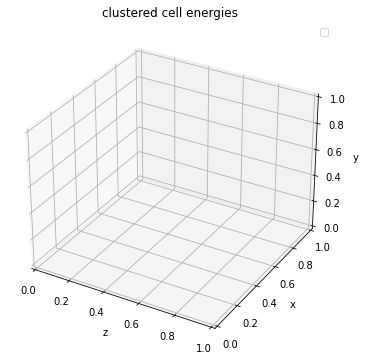

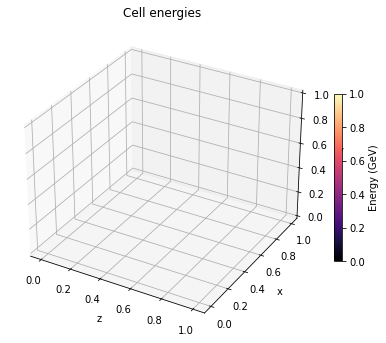

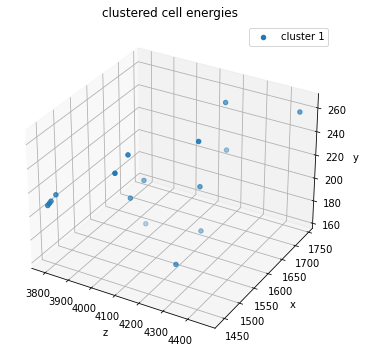

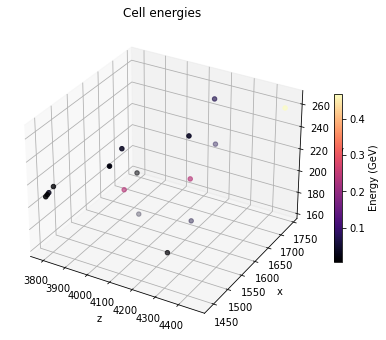

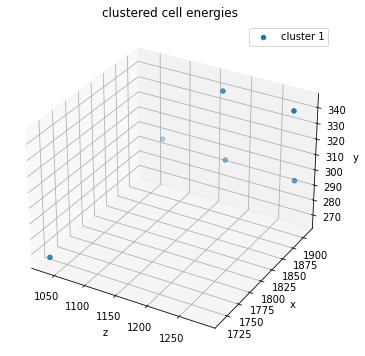

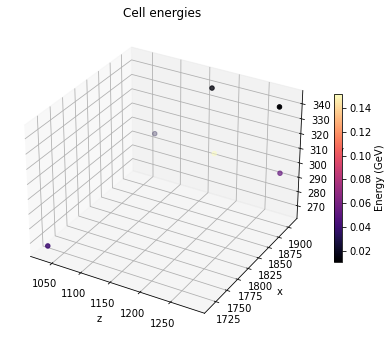

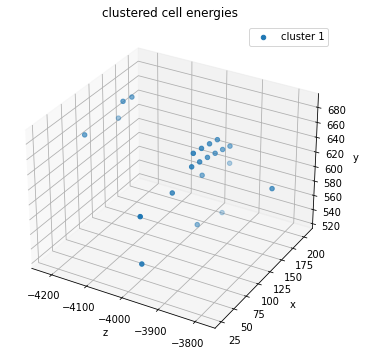

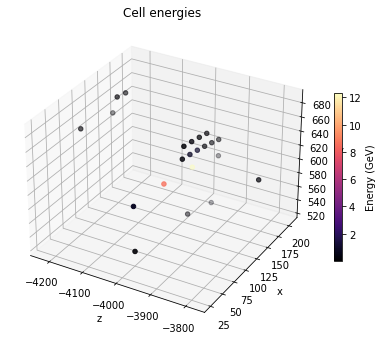

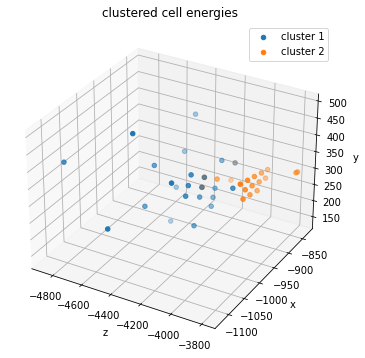

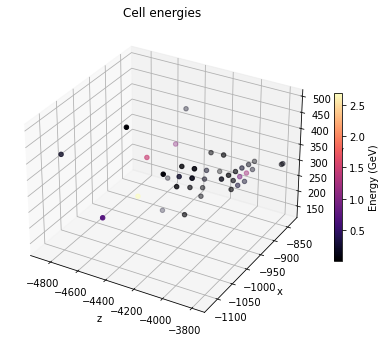

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


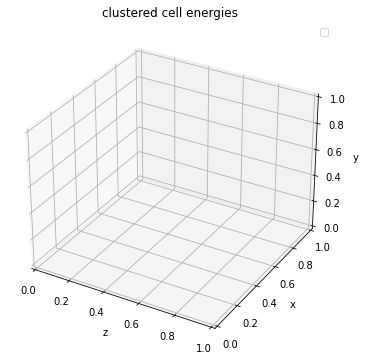

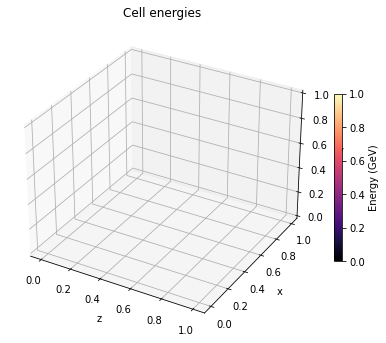

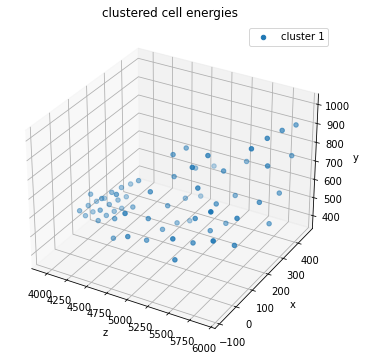

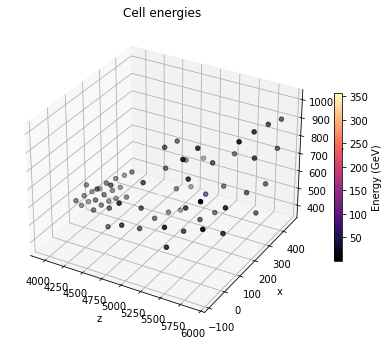

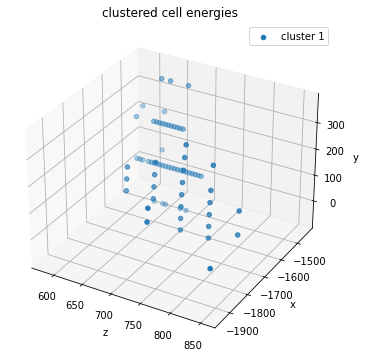

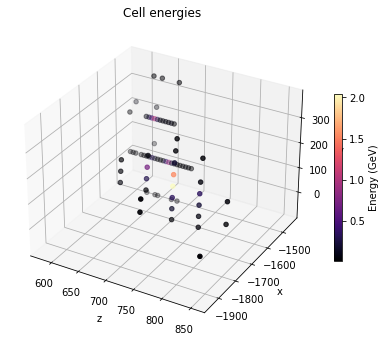

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


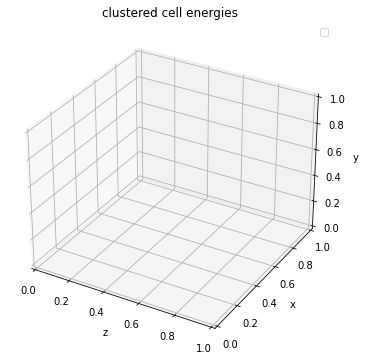

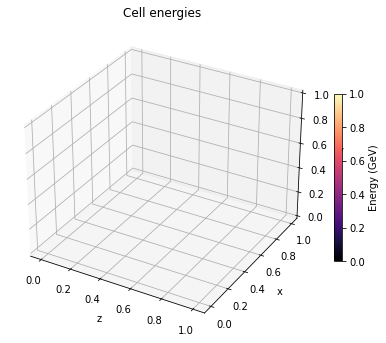

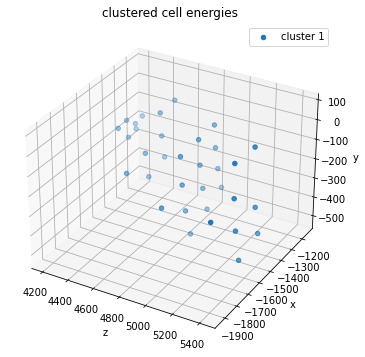

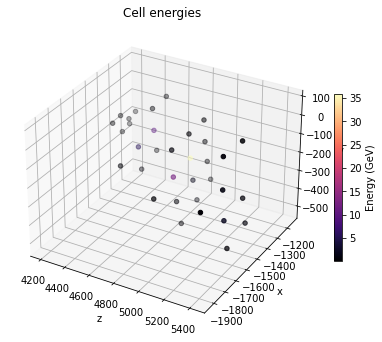

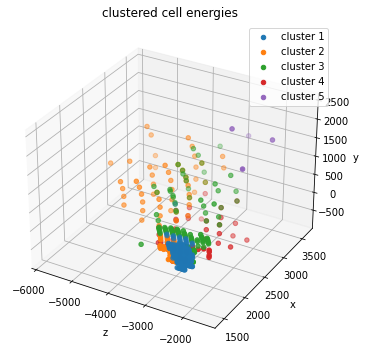

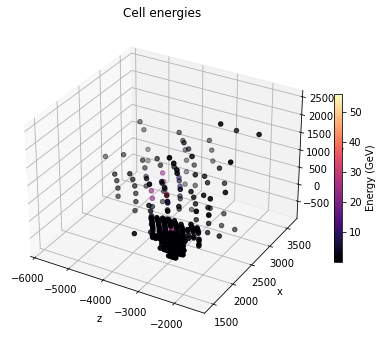

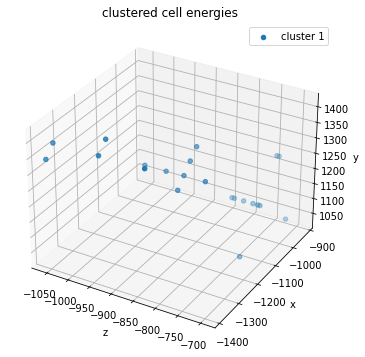

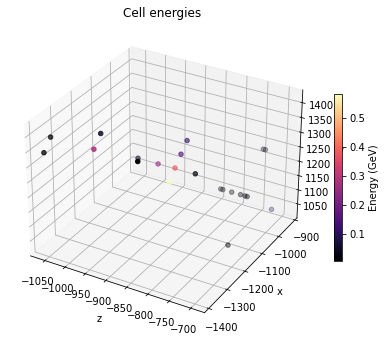

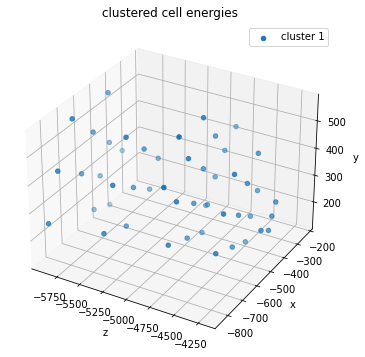

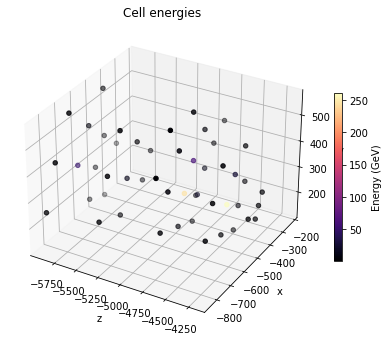

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


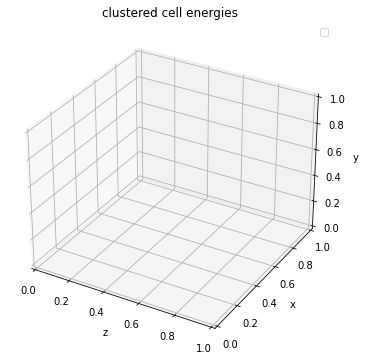

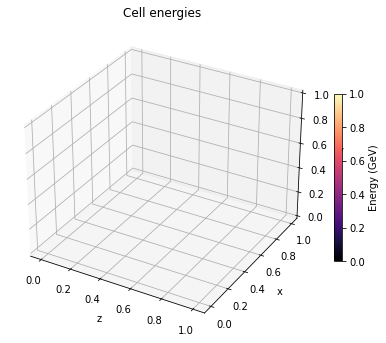

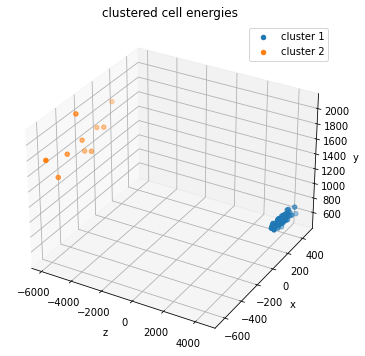

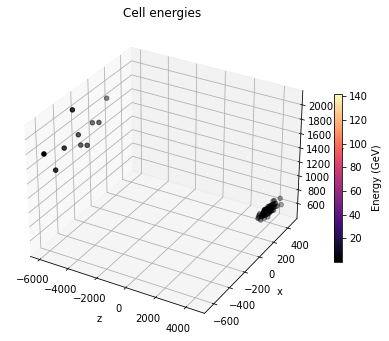

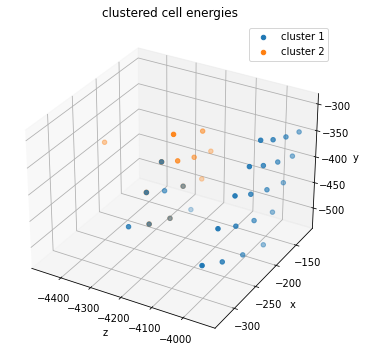

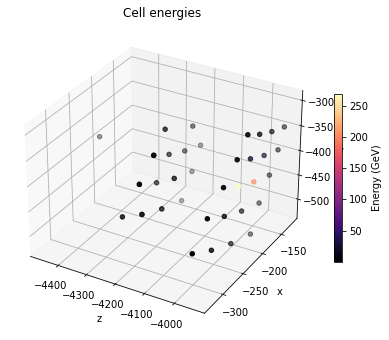

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


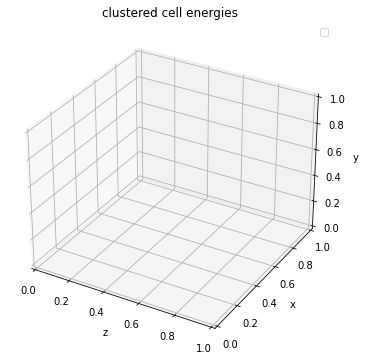

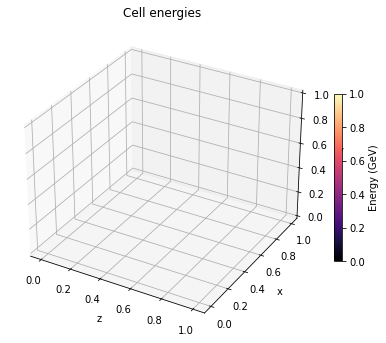

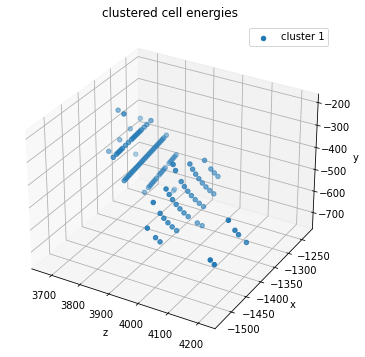

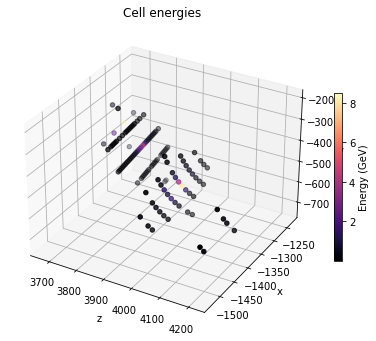

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


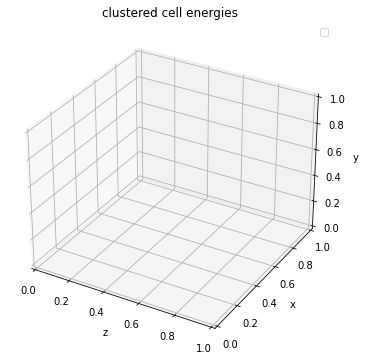

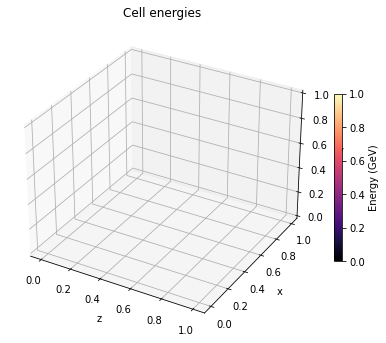

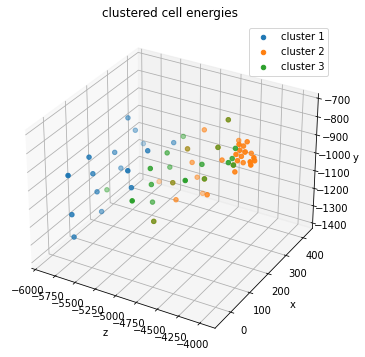

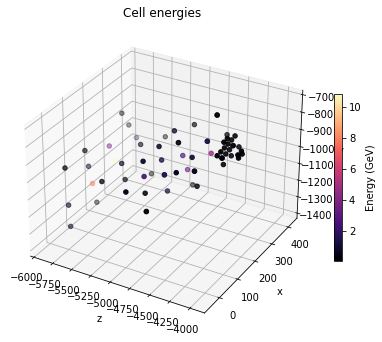

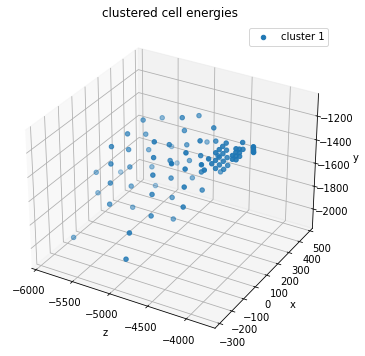

...

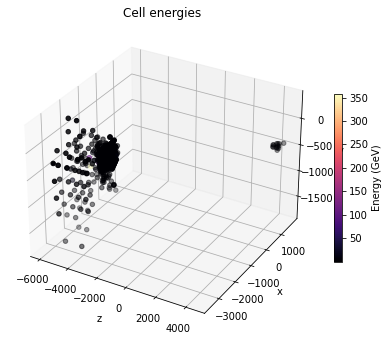

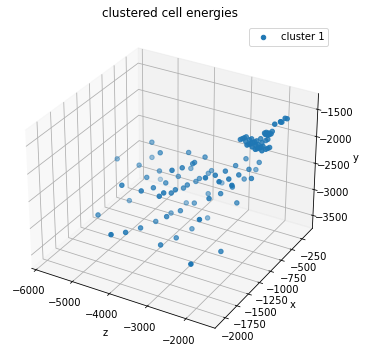

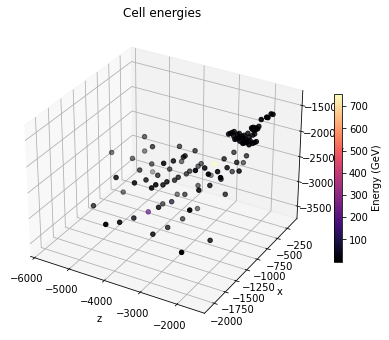

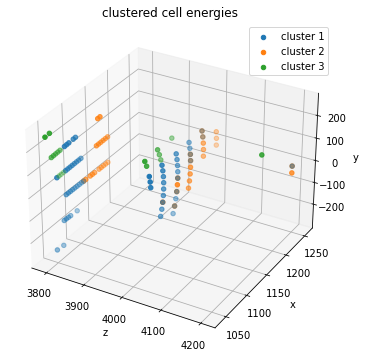

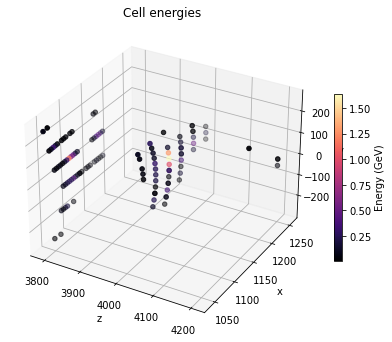

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


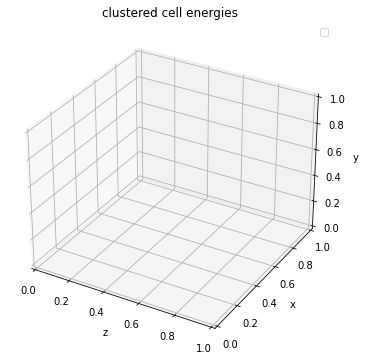

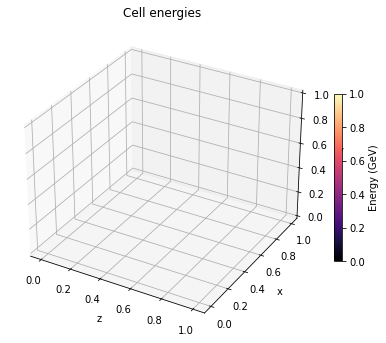

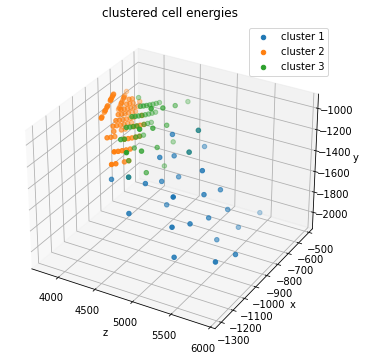

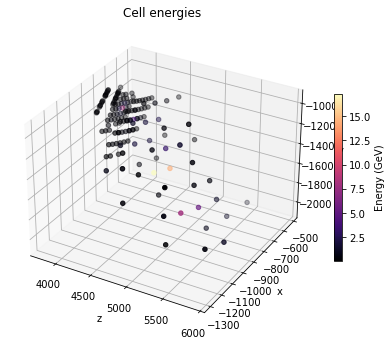

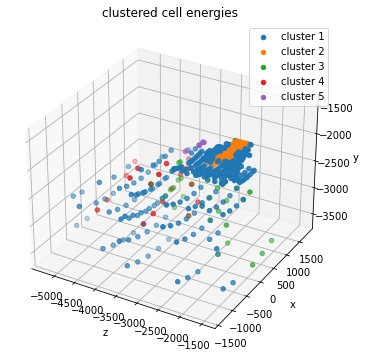

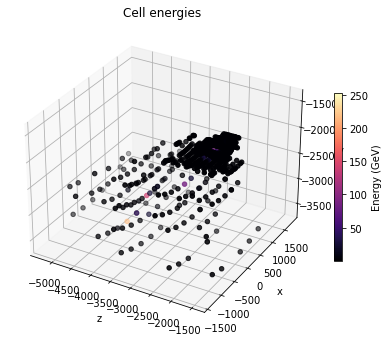

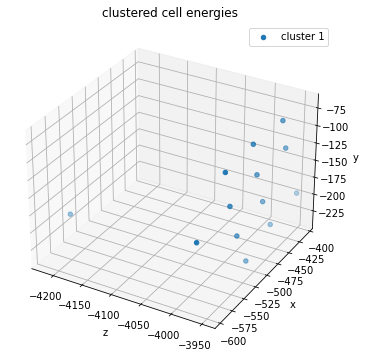

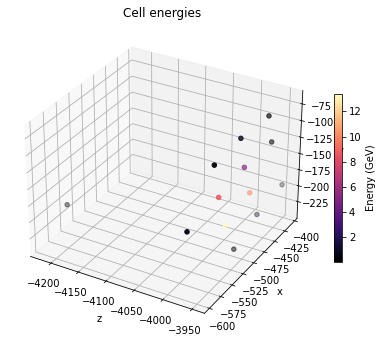

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


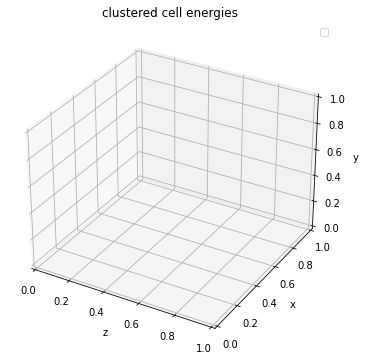

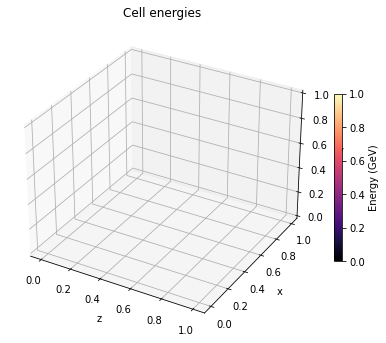

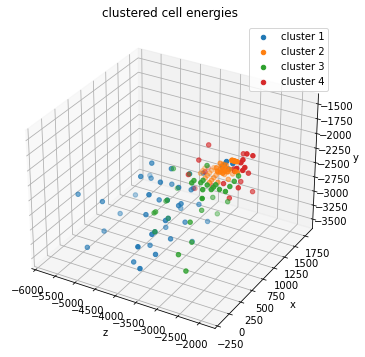

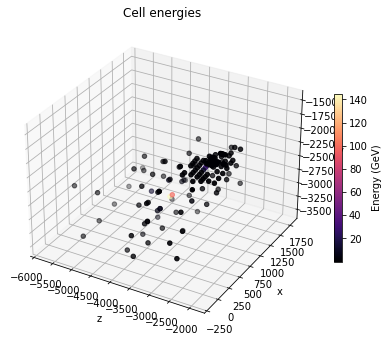

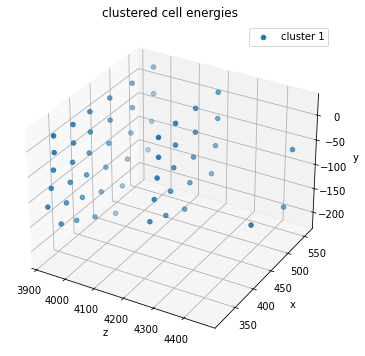

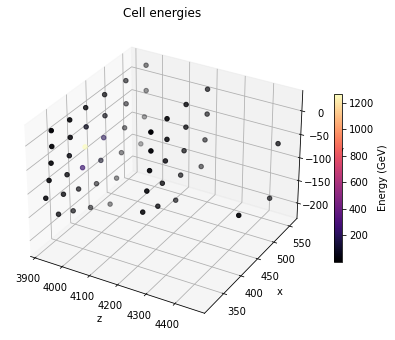

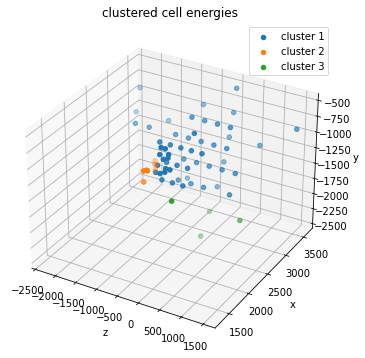

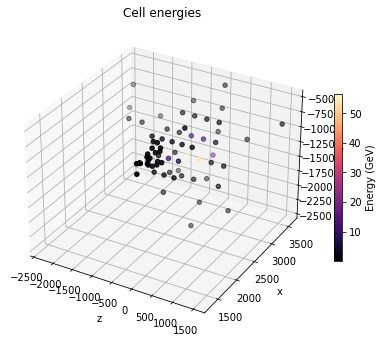

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


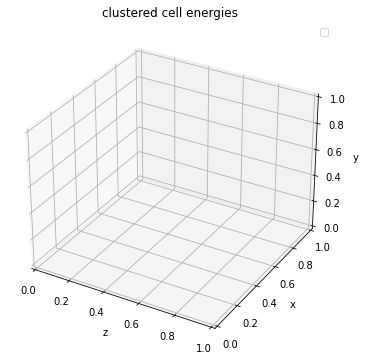

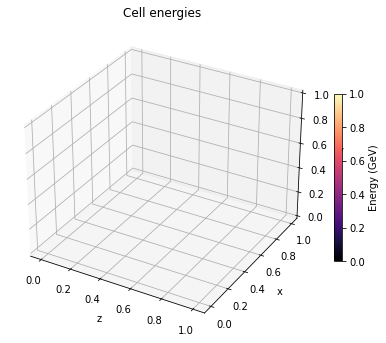

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


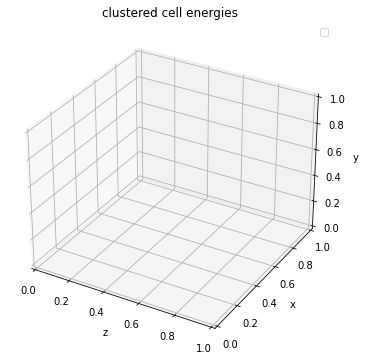

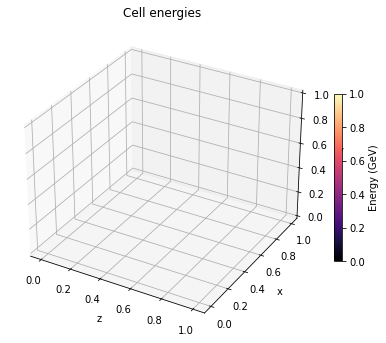

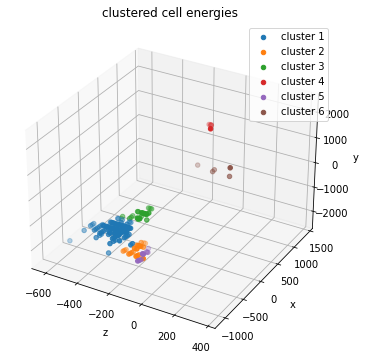

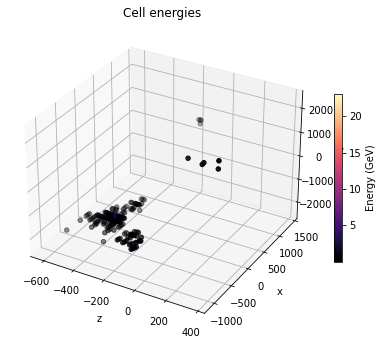

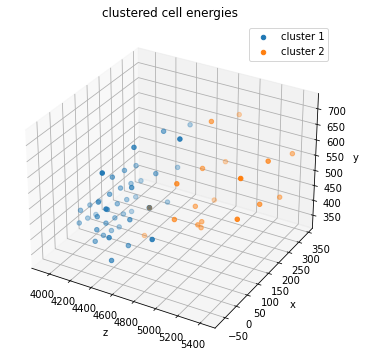

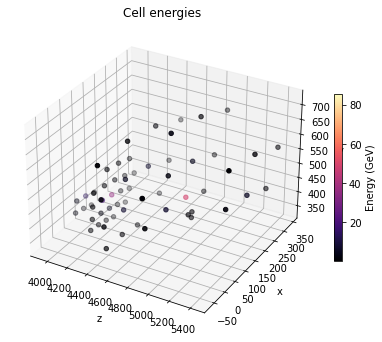

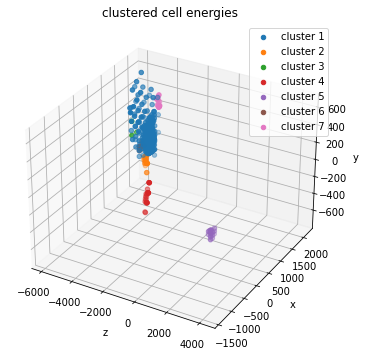

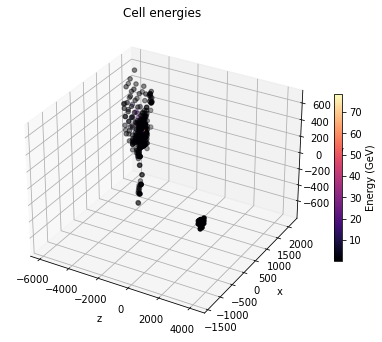

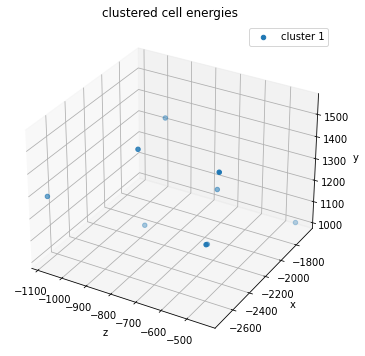

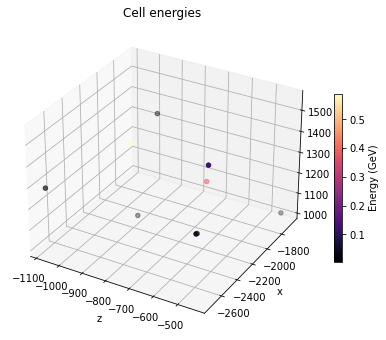

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


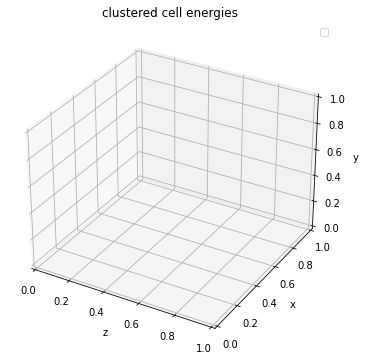

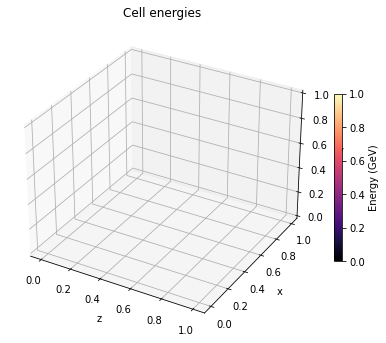

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


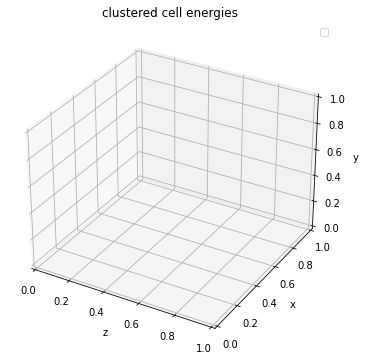

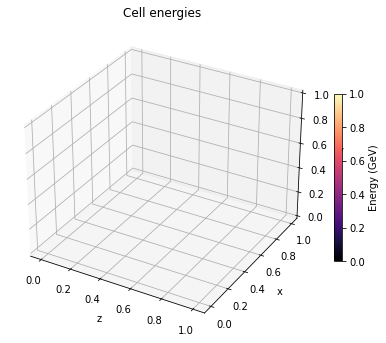

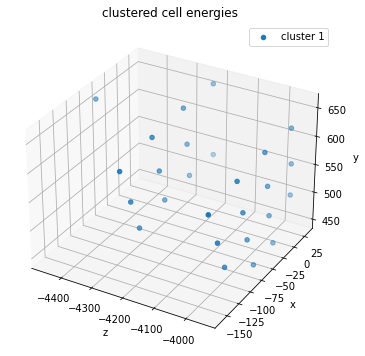

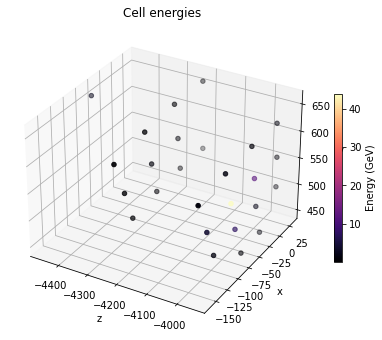

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


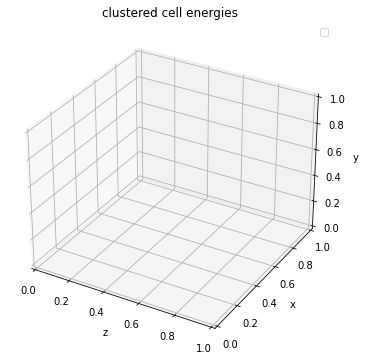

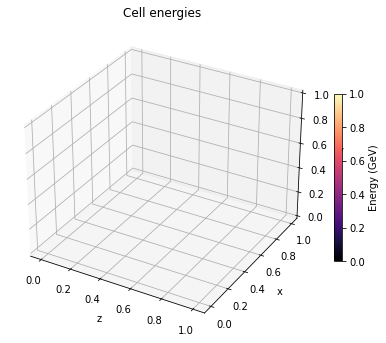

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


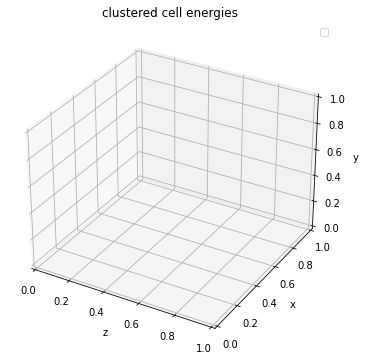

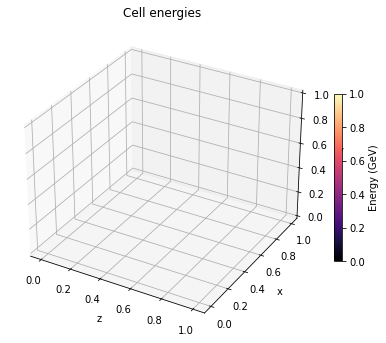

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


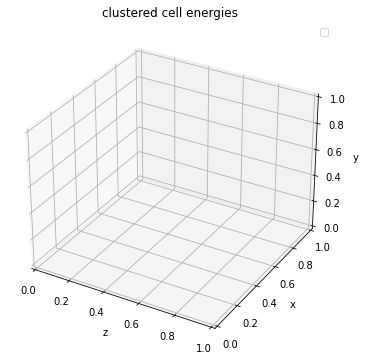

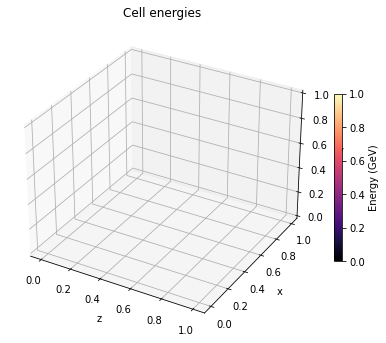

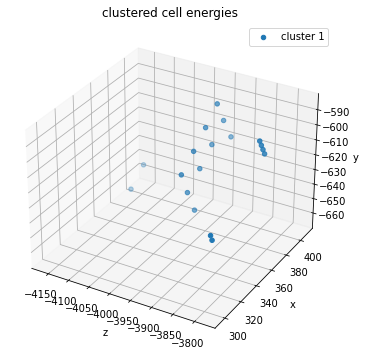

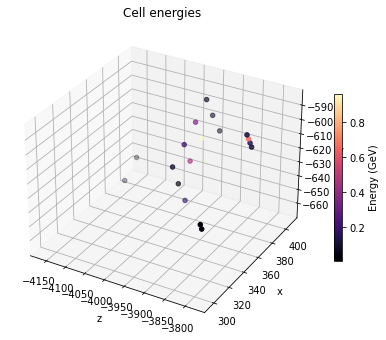

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


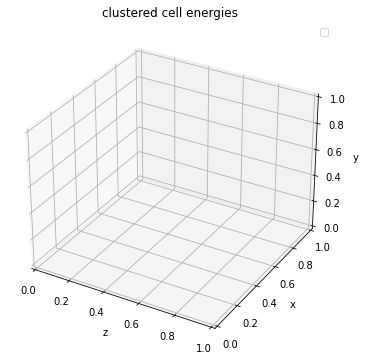

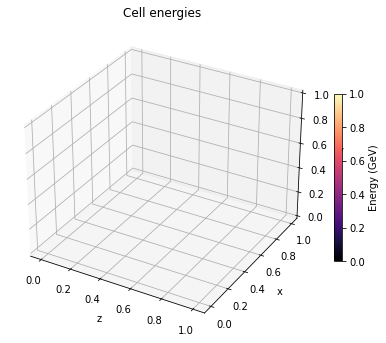

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


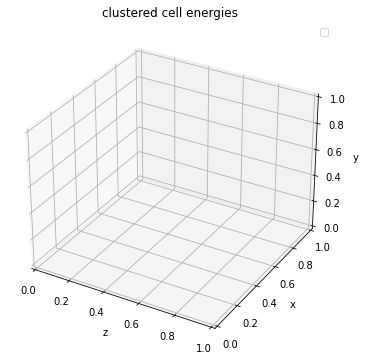

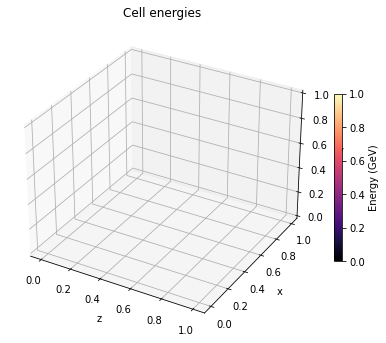

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


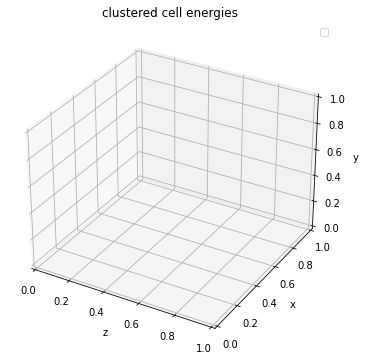

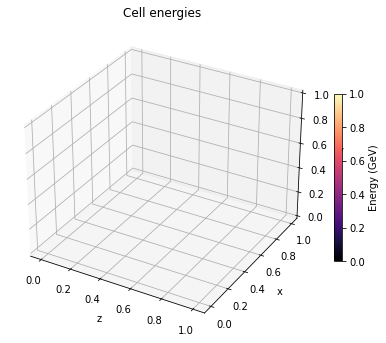

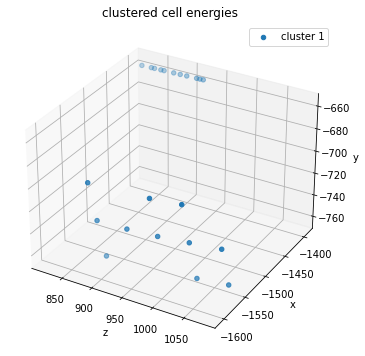

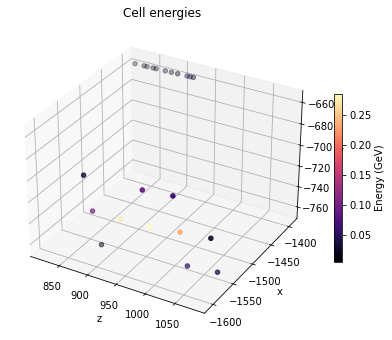

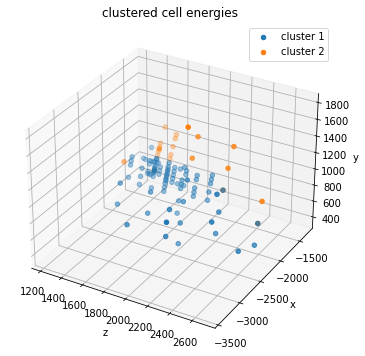

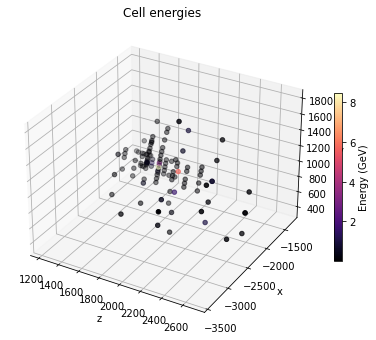

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


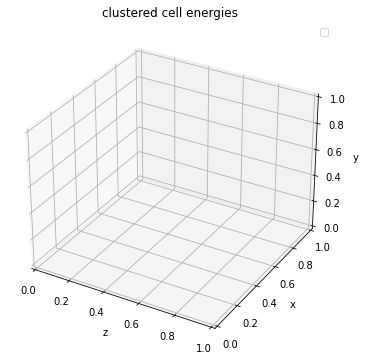

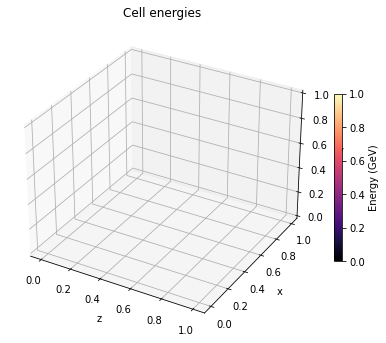

In [50]:
# plot 3 events clusters and energies - use event data and num events loaded from file
for event_idx in range(100):
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca(projection='3d')

    x_event = []
    y_event = []
    z_event = []
    energy_event = []
    num_clusters = event_data["nCluster"][event_idx]
    for cluster_idx in range(num_clusters):
        cell_IDs = event_data['cluster_cell_ID'][event_idx][cluster_idx]
        cell_ID_map = sorter[np.searchsorted(cell_geo_ID, cell_IDs, sorter=sorter)]

        # get cluster cell energy
        cluster_cell_E = np.log(event_data["cluster_cell_E"][event_idx][cluster_idx])

        # node features
        node_features = {}
        for feature in ["cell_geo_eta", "cell_geo_phi", "cell_geo_rPerp"]:
            node_features[feature] = cell_geo_data[feature][0][cell_ID_map]

        # get cartesian coords
        thetas = [2*np.arctan(np.exp(-eta)) for eta in node_features["cell_geo_eta"]]
        x, y, z = spherical_to_cartesian_cor(node_features["cell_geo_rPerp"], node_features["cell_geo_phi"], thetas)
        ax.scatter(z, x, y, label="cluster " + str(cluster_idx + 1))

        x_event.extend(x)
        y_event.extend(y)
        z_event.extend(z)
        energy_event.extend(cluster_cell_E)
        
    ax.set_xlabel("z")
    ax.set_ylabel("x")
    ax.set_zlabel("y")
    ax.legend()
    plt.title("clustered cell energies")
    plt.show()

    # plot event energies
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca(projection='3d')
    p = ax.scatter(z_event, x_event, y_event, c=energy_event, cmap=plt.cm.magma)
    fig.colorbar(p, label="Energy (GeV)", fraction=0.025)
    ax.set_xlabel("z")
    ax.set_ylabel("x")
    ax.set_zlabel("y")
    plt.title("Cell energies")
    plt.show()
